# **Connecting to the DataBase**


In [1]:
import pyodbc
import pandas as pd

# Obtenez la liste des pilotes ODBC installés
drivers = [driver for driver in pyodbc.drivers()]

# Affichez la liste des pilotes
for driver in drivers:
    print(driver)

SQL Server
SQL Server Native Client 11.0
Microsoft Access Driver (*.mdb, *.accdb)
Microsoft Excel Driver (*.xls, *.xlsx, *.xlsm, *.xlsb)
Microsoft Access Text Driver (*.txt, *.csv)


In [2]:
import pyodbc
import pandas as pd  # Importez pandas
# Paramètres de connexion
server = 'DESKTOP-ESB8B0G'
database = 'DW_COCACOLA'

# Chaîne de connexion avec authentification Windows
conn_str = (
    f'DRIVER=SQL Server Native Client 11.0;'
    f'SERVER={server};'
    f'DATABASE={database};'
    f'Trusted_Connection=yes;'  # Utilisez l'authentification Windows
)

# Établir la connexion
conn = pyodbc.connect(conn_str)


# **Location Dim**

In [3]:
# Exécuter la requête SQL
sql_query = 'SELECT * FROM DimLocations'
DimLocations = pd.read_sql(sql_query, conn)

# Afficher les premières lignes du DataFrame
DimLocations

C:\Users\MSI\AppData\Local\Temp\ipykernel_57764\3347378179.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  DimLocations = pd.read_sql(sql_query, conn)


,Location_PK,country,city,postal_code,Code_City,Adress,LocationName
0,117,Australia,Sydney,2000,452,20 Bridge Street,Sydney Stock
1,118,UK,London,9817,456,10 Paternoster Square,London Stock
2,119,USA,New York,10005,123,11 Wall Street,NYSE
3,120,USA,New York,10036,123,151 West 42nd Street,NASDAQ
4,121,Hong Kong,Hong Kong,19077,789,1F 7F,Hong Kong
5,122,Germany,Frankfurt,60313,567,Borsenplatz 4,Frankfurt Stock
6,123,China,Shanghai,80201,890,528 South Pudong Road,Shanghai Stock
7,124,Japan,Tokyo,103026,234,21 Nihonbashi Kabutocho,Tokyo Stock
8,125,India,Mumbai,400001,716,P J Towers Dalal Street,Bombay Stock


# Data Cleaning

### **Checking null and duplicate values**

In [4]:
DimLocations.isnull().sum()

Location_PK     0
country         0
city            0
postal_code     0
Code_City       0
Adress          0
LocationName    0
dtype: int64

In [5]:
DimLocations.duplicated().sum()

0

# **Transforming Location dim columns to numeric**

In [6]:
from sklearn.preprocessing import LabelEncoder

DimLocations['COUNTRY_NUMERIC'] = LabelEncoder().fit_transform(DimLocations['country'])


DimLocations.drop(columns=['country'], inplace=True)

DimLocations['CITY_NUMERIC'] = LabelEncoder().fit_transform(DimLocations['city'])


DimLocations.drop(columns=['city'], inplace=True)
DimLocations['ADDRESS_NUMERIC'] = LabelEncoder().fit_transform(DimLocations['Adress'])


DimLocations.drop(columns=['Adress'], inplace=True)
DimLocations['LOCATION_NAME_NUMERIC'] = LabelEncoder().fit_transform(DimLocations['LocationName'])


DimLocations.drop(columns=['LocationName'], inplace=True)
DimLocations

,Location_PK,postal_code,Code_City,COUNTRY_NUMERIC,CITY_NUMERIC,ADDRESS_NUMERIC,LOCATION_NAME_NUMERIC
0,117,2000,452,0,6,4,7
1,118,9817,456,6,2,0,3
2,119,10005,123,7,4,1,5
3,120,10036,123,7,4,2,4
4,121,19077,789,3,1,3,2
5,122,60313,567,2,0,7,1
6,123,80201,890,1,5,6,6
7,124,103026,234,5,7,5,8
8,125,400001,716,4,3,8,0


# **Dim Date**

In [7]:
# Exécuter la requête SQL
sql_query = 'SELECT * FROM DimDate'
DimDate = pd.read_sql(sql_query, conn)

# Afficher les premières lignes du DataFrame
DimDate

C:\Users\MSI\AppData\Local\Temp\ipykernel_57764\2355992126.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  DimDate = pd.read_sql(sql_query, conn)


,DateKey,Date,FullDate,DayOfMonth,DayOfWeek,DayOfYear,Quarter,Year,Season
0,19650101,1965-01-01,01/01/1965,1,6,1,1,1965,Winter
1,19650102,1965-01-02,02/01/1965,2,7,2,1,1965,Winter
2,19650103,1965-01-03,03/01/1965,3,1,3,1,1965,Winter
3,19650104,1965-01-04,04/01/1965,4,2,4,1,1965,Winter
4,19650105,1965-01-05,05/01/1965,5,3,5,1,1965,Winter
...,...,...,...,...,...,...,...,...,...
21516,20231129,2023-11-29,29/11/2023,29,4,333,4,2023,Fall
21517,20231130,2023-11-30,30/11/2023,30,5,334,4,2023,Fall
21518,20231201,2023-12-01,01/12/2023,1,6,335,4,2023,Winter
21519,20231202,2023-12-02,02/12/2023,2,7,336,4,2023,Winter


# Data Cleaning

In [8]:
DimDate.isnull().sum()

DateKey       0
Date          0
FullDate      0
DayOfMonth    0
DayOfWeek     0
DayOfYear     0
Quarter       0
Year          0
Season        0
dtype: int64

In [9]:
DimDate.duplicated().sum()

0

# **Feature engineering for Dim Date**

# Dim Stock Exchange 

In [10]:
# Exécuter la requête SQL
sql_query = 'SELECT * FROM DimStockExchange'
dimSE = pd.read_sql(sql_query, conn)

# Afficher les premières lignes du DataFrame
dimSE.head()

C:\Users\MSI\AppData\Local\Temp\ipykernel_57764\1654283203.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  dimSE = pd.read_sql(sql_query, conn)


,StockExchange_PK,StockExchange_Name,Currency,CodeExchange,Pays,CodeISIN,liquidity_of_stock
0,466997,XSD,USD,1001,United States,US1001,Less Liquid
1,466998,KIV,ARS,1004,Argentina,AR1004,Less Liquid
2,466999,XGF,CLP,1045,Chile,CL1045,Very Liquid
3,467000,DUI,BRL,1050,Brazil,BR1050,Very Liquid
4,467001,CEC,JPY,1060,Japan,JP1060,Less Liquid


# Data Cleaning

### **Checking null and duplicate values**

In [11]:
dimSE.isnull().sum()

StockExchange_PK      0
StockExchange_Name    0
Currency              0
CodeExchange          0
Pays                  0
CodeISIN              0
liquidity_of_stock    0
dtype: int64

In [12]:
dimSE.duplicated().sum()

0

# Transformation to numeric 

In [13]:
from sklearn.preprocessing import LabelEncoder

dimSE['Pays_NUM'] = LabelEncoder().fit_transform(dimSE['Pays'])

dimSE.drop(columns=['Pays'], inplace=True)
dimSE['Currency_NUM'] = LabelEncoder().fit_transform(dimSE['Currency'])

dimSE.drop(columns=['Currency'], inplace=True)

dimSE['Liquidity_NUM'] = LabelEncoder().fit_transform(dimSE['liquidity_of_stock'])

dimSE.drop(columns=['liquidity_of_stock'], inplace=True)

dimSE['CodeISIN_NUM'] = LabelEncoder().fit_transform(dimSE['CodeISIN'])

dimSE.drop(columns=['CodeISIN'], inplace=True)
dimSE['Stock_Exchange_Name'] = LabelEncoder().fit_transform(dimSE['StockExchange_Name'])

dimSE.drop(columns=['StockExchange_Name'], inplace=True)
dimSE

,StockExchange_PK,CodeExchange,Pays_NUM,Currency_NUM,Liquidity_NUM,CodeISIN_NUM,Stock_Exchange_Name
0,466997,1001,6,6,1,769,827
1,466998,1004,0,0,1,0,354
2,466999,1045,2,2,3,250,807
3,467000,1050,1,1,3,126,127
4,467001,1060,4,4,1,503,71
...,...,...,...,...,...,...,...
918,467915,9909,6,6,2,922,224
919,467916,9933,2,2,3,383,240
920,467917,9947,4,4,3,650,325
921,467918,9987,5,5,2,768,349


# **Stock's Performance fact table**

In [14]:

# Exécuter la requête SQL
sql_query = 'SELECT * FROM Fact_Perfomances'
FactPerf = pd.read_sql(sql_query, conn)
# Get the 'CodeISIN' values from the 'StockExchange' DataFrame
code_isin_values = dimSE['CodeISIN_NUM'].tolist()

# Calculate the number of times 'CodeISIN' values should be repeated
repeat_factor = len(FactPerf) // len(code_isin_values) + 1

# Repeat 'CodeISIN' values and create a list of the appropriate length
repeated_code_isin = code_isin_values * repeat_factor

# Trim the list to match the length of 'FactPerf'
repeated_code_isin = repeated_code_isin[:len(FactPerf)]

# Add the 'CodeISIN' column to the 'FactPerf' DataFrame
FactPerf['CodeISIN'] = repeated_code_isin

# Afficher les premières lignes du DataFrame
FactPerf


C:\Users\MSI\AppData\Local\Temp\ipykernel_57764\2034799575.py:3: UserWarning: pandas only supports SQLAlchemy connectable (engine/connection) or database string URI or sqlite3 DBAPI2 connection. Other DBAPI2 objects are not tested. Please consider using SQLAlchemy.
  FactPerf = pd.read_sql(sql_query, conn)


,Revenue,Profit,High,Low,Open_Price,Close_Price,Adj_Close,Volume,VolumeRate,Date_FK,Company_FK,Location_FK,StockExchange_FK,investor_FK,Change,CodeISIN
0,46.854,7060.0,30.500000,30.125000,16.043193,30.312500,16.164536,5933000.0,822.447457,19970214,553,119,467153,603.0,0.0,769
1,46.854,7060.0,30.750000,30.250000,30.312500,30.750000,16.397837,0.0,0.000000,19970218,553,119,467153,603.0,0.0,0
2,46.854,7060.0,16.258175,30.625000,30.750000,31.000000,16.531151,5995200.0,830.879448,19970219,553,119,467153,603.0,0.0,250
3,46.854,7060.0,30.937500,16.004907,30.937500,30.625000,16.331175,5168600.0,716.333043,19970220,553,119,467153,603.0,0.0,126
4,46.854,7060.0,31.125000,30.562500,30.625000,31.000000,16.531151,8153200.0,1127.664211,19970221,553,119,467153,603.0,0.0,503
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
14336,46.854,7060.0,29.187500,28.500000,28.875000,29.125000,15.531282,0.0,0.000000,19970207,553,119,467153,603.0,0.0,319
14337,46.854,7060.0,29.812500,29.125000,16.043193,29.125000,15.531282,4787000.0,663.850611,19970210,553,119,467153,603.0,0.0,66
14338,46.854,7060.0,29.625000,29.125000,29.125000,16.099507,0.049045,4324600.0,599.736909,19970211,553,119,467153,603.0,0.0,67
14339,46.854,7060.0,30.125000,29.625000,29.625000,30.125000,16.064543,7335800.0,1015.145397,19970212,553,119,467153,603.0,0.0,720


# Data Cleaning


### **Treating null and duplicate values**

In [15]:
FactPerf.isnull().sum()

Revenue               0
Profit                0
High                  0
Low                   0
Open_Price            0
Close_Price           0
Adj_Close             0
Volume                0
VolumeRate            0
Date_FK               0
Company_FK            0
Location_FK           0
StockExchange_FK      0
investor_FK         437
Change                0
CodeISIN              0
dtype: int64

In [16]:
FactPerf.dropna(inplace=True)
FactPerf.isnull().sum()

Revenue             0
Profit              0
High                0
Low                 0
Open_Price          0
Close_Price         0
Adj_Close           0
Volume              0
VolumeRate          0
Date_FK             0
Company_FK          0
Location_FK         0
StockExchange_FK    0
investor_FK         0
Change              0
CodeISIN            0
dtype: int64

In [17]:
FactPerf.duplicated().sum()

0

# *Feature engineering*

In [18]:
# Triez votre DataFrame par la colonne Date_FK
FactPerf = FactPerf.sort_values(by=['Date_FK'])
FactPerf.reset_index(drop=True, inplace=True)
# Calculez la colonne "Change" en pourcentage
FactPerf['Change'] = ((FactPerf['Close_Price'] - FactPerf['Close_Price'].shift(1)) / FactPerf['Close_Price'].shift(1)) * 100
# Remplacez les valeurs NaN dans la première ligne par 0, car il n'y a pas de valeur précédente
FactPerf['Change'].fillna(0, inplace=True)
FactPerf['Range'] = (FactPerf['High'] - FactPerf['Low'])
FactPerf['Revenue'] =FactPerf['Revenue']*1000
#FactPerf['Profit_Margin'] =(FactPerf['Profit'] -FactPerf['Revenue'])*100
FactPerf['Return']=100*(FactPerf['Close_Price']-FactPerf['Open_Price'])/FactPerf['Open_Price']
FactPerf['Price_Difference'] = FactPerf['Close_Price'] - FactPerf['Open_Price']
# Calculate daily gains and losses
FactPerf['Gain'] = FactPerf['Close_Price'].diff()
FactPerf['Loss'] = -FactPerf['Gain'].apply(lambda x: min(0, x))
# Calculate average gains and losses over the specified period
n=7
FactPerf['Avg Gain'] = FactPerf['Gain'].rolling(window=n).mean()
FactPerf['Avg Loss'] = FactPerf['Loss'].rolling(window=n).mean()
# Calculate RS and RSIF
FactPerf['RS'] = FactPerf['Avg Gain'] / FactPerf['Avg Loss']
FactPerf['RSI'] = 100 - (100 / (1 + FactPerf['RS']))
# Convertissez la colonne 'Date_FK' en format de date si ce n'est pas déjà le cas
FactPerf['Date'] = pd.to_datetime(FactPerf['Date_FK'], format='%Y%m%d', errors='coerce')
FactPerf.dropna(inplace=True)
FactPerf.drop(columns=['Gain','Loss','Revenue','Profit','Company_FK', 'Location_FK','investor_FK','Date_FK','StockExchange_FK'], inplace=True)
FactPerf

,High,Low,Open_Price,Close_Price,Adj_Close,Volume,VolumeRate,Change,CodeISIN,Range,Return,Price_Difference,Avg Gain,Avg Loss,RS,RSI,Date
7,0.259115,0.254557,0.259115,0.257161,0.049994,883200.0,124.256390,-98.402678,362,0.004558,-0.754113,-0.001954,0.000000,4.527501,0.000000,0.000000,1962-01-12
8,0.256510,0.253906,0.256510,0.254557,0.049488,614400.0,86.439331,-1.012587,97,0.002604,-0.761364,-0.001953,-0.000651,4.527873,-0.000144,-0.014383,1962-01-15
9,0.253906,16.004907,0.253906,16.099507,0.048602,1113600.0,155.978047,6224.519038,626,-15.751001,6240.734779,15.845601,2.263750,4.527036,0.500051,33.335616,1962-01-16
10,0.250000,0.242188,0.250000,0.242188,0.047083,1574400.0,221.501941,-98.495681,627,0.007812,-3.124797,-0.007812,-2.265331,6.792367,-0.333511,-50.040059,1962-01-17
11,0.243490,0.236328,0.242188,16.099507,0.046134,2649600.0,371.942826,6547.524379,628,0.007162,6547.524379,15.857319,2.263471,4.528896,0.499784,33.323749,1962-01-18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13899,55.130001,54.590000,54.750000,54.860001,54.860001,13846400.0,1889.988021,-0.254544,430,0.540001,0.200914,0.110001,0.344286,5.585785,0.061636,5.805760,2021-12-09
13900,57.930000,56.959999,16.043193,57.759998,57.759998,31362800.0,4298.896187,5.286179,566,0.970001,260.028081,41.716806,0.780000,5.564356,0.140178,12.294390,2021-12-13
13901,58.169998,57.400002,57.400002,57.799999,57.799999,0.0,0.000000,0.069254,702,0.769997,0.696860,0.399998,0.675714,5.564356,0.121436,10.828632,2021-12-14
13902,58.880001,57.900002,57.980000,58.650002,58.650002,24696900.0,3364.579256,1.470592,567,0.980000,1.155574,0.670002,0.730000,5.564356,0.131192,11.597693,2021-12-16


# Treating Outliers

In [19]:
# Liste des colonnes numériques que vous souhaitez vérifier
colonnes_numeriques =['Open_Price', 'High', 'Low', 'Close_Price', 'Adj_Close', 'Volume', 'VolumeRate','Change','Avg Gain','Avg Loss','RS','RSI']

# Parcourir chaque colonne
for colonne in colonnes_numeriques:
    # Calculez les quartiles Q1 (25e percentile) et Q3 (75e percentile)
    Q1 = FactPerf[colonne].quantile(0.25)
    Q3 = FactPerf[colonne].quantile(0.75)

    # Calculez l'IQR (Interquartile Range)
    IQR = Q3 - Q1

    # Calculez les limites pour les valeurs aberrantes
    borne_inferieure = Q1 - 1.5 * IQR
    borne_superieure = Q3 + 1.5 * IQR

    # Vérifiez quelles lignes contiennent des valeurs aberrantes dans la colonne sélectionnée
    valeurs_aberrantes = FactPerf[(FactPerf[colonne] < borne_inferieure) | (FactPerf[colonne] > borne_superieure)]

    # Affichez les lignes contenant des valeurs aberrantes pour cette colonne, si elles existent
    if not valeurs_aberrantes.empty:
        print(f"\nLignes avec des valeurs aberrantes dans la colonne '{colonne}':")
        print(valeurs_aberrantes)
    else :
         print(f"\nPas des valeurs aberrantes pour: '{colonne}':")


Pas des valeurs aberrantes pour: 'Open_Price':

Pas des valeurs aberrantes pour: 'High':

Pas des valeurs aberrantes pour: 'Low':

Pas des valeurs aberrantes pour: 'Close_Price':

Lignes avec des valeurs aberrantes dans la colonne 'Adj_Close':
            High        Low  Open_Price  Close_Price  Adj_Close      Volume  \
12950  47.480000  46.619999   16.043193    16.099507  41.314175  17200700.0   
12989  47.000000  46.549999   46.580002    46.820000  41.117195  12143100.0   
12990  47.070000  46.610001   46.750000    46.880001  41.169888  11952900.0   
12991  16.258175  46.869999   46.990002    47.160000  41.415771  16187400.0   
12992  47.500000  47.090000   47.139999    47.380001  41.608986   9577400.0   
...          ...        ...         ...          ...        ...         ...   
13899  55.130001  54.590000   54.750000    54.860001  54.860001  13846400.0   
13900  57.930000  56.959999   16.043193    57.759998  57.759998  31362800.0   
13901  58.169998  57.400002   57.400002    5

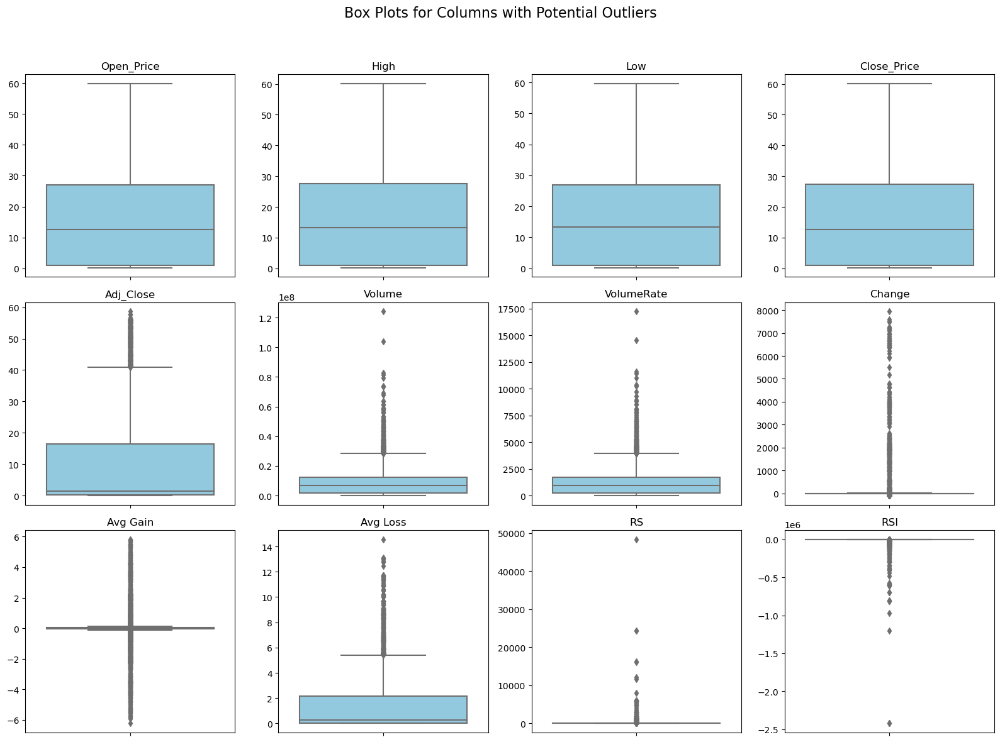

In [20]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the columns with potential outliers
columns_with_outliers = ['Open_Price', 'High', 'Low', 'Close_Price', 'Adj_Close', 'Volume', 'VolumeRate', 'Change', 'Avg Gain', 'Avg Loss', 'RS', 'RSI']

# Calculate the number of rows and columns needed
num_columns = len(columns_with_outliers)
num_rows = (num_columns - 1) // 4 + 1

# Create subplots for each column in a dynamic grid
fig, axes = plt.subplots(num_rows, 4, figsize=(16, 4 * num_rows))
fig.suptitle('Box Plots for Columns with Potential Outliers', fontsize=16)

# Create box plots for each column
for i, column in enumerate(columns_with_outliers):
    sns.boxplot(data=FactPerf, y=column, ax=axes[i // 4, i % 4], color='skyblue')
    axes[i // 4, i % 4].set_title(column)
    axes[i // 4, i % 4].set_ylabel('')
    axes[i // 4, i % 4].set_xlabel('')

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Show the plots
plt.show()


**Handling Outliers in Specific Columns and Replacing with Max and Min Non-Outlier Values**

In [21]:
import pandas as pd


# Define the columns with outliers
columns_with_outliers = ['Adj_Close', 'Volume', 'VolumeRate', 'Change', 'RSI', 'RS', 'Avg Loss', 'Avg Gain']

# Loop through each column with outliers
for column in columns_with_outliers:
    # Calculate the IQR (Interquartile Range)
    Q1 = FactPerf[column].quantile(0.25)
    Q3 = FactPerf[column].quantile(0.75)
    IQR = Q3 - Q1

    # Define the lower and upper bounds for identifying outliers
    lower_bound = Q1 - 1.5 * IQR
    upper_bound = Q3 + 1.5 * IQR

    # Identify high and low outliers
    high_outliers = FactPerf[FactPerf[column] > upper_bound]
    low_outliers = FactPerf[FactPerf[column] < lower_bound]

    # Replace high outliers with the maximum non-outlier value in the column
    max_non_outlier = FactPerf[(FactPerf[column] >= lower_bound) & (FactPerf[column] <= upper_bound)][column].max()
    FactPerf.loc[high_outliers.index, column] = max_non_outlier

    # Replace low outliers with the minimum non-outlier value in the column
    min_non_outlier = FactPerf[(FactPerf[column] >= lower_bound) & (FactPerf[column] <= upper_bound)][column].min()
    FactPerf.loc[low_outliers.index, column] = min_non_outlier

# Now, df contains the outliers in the specified columns replaced with max and min non-outlier values


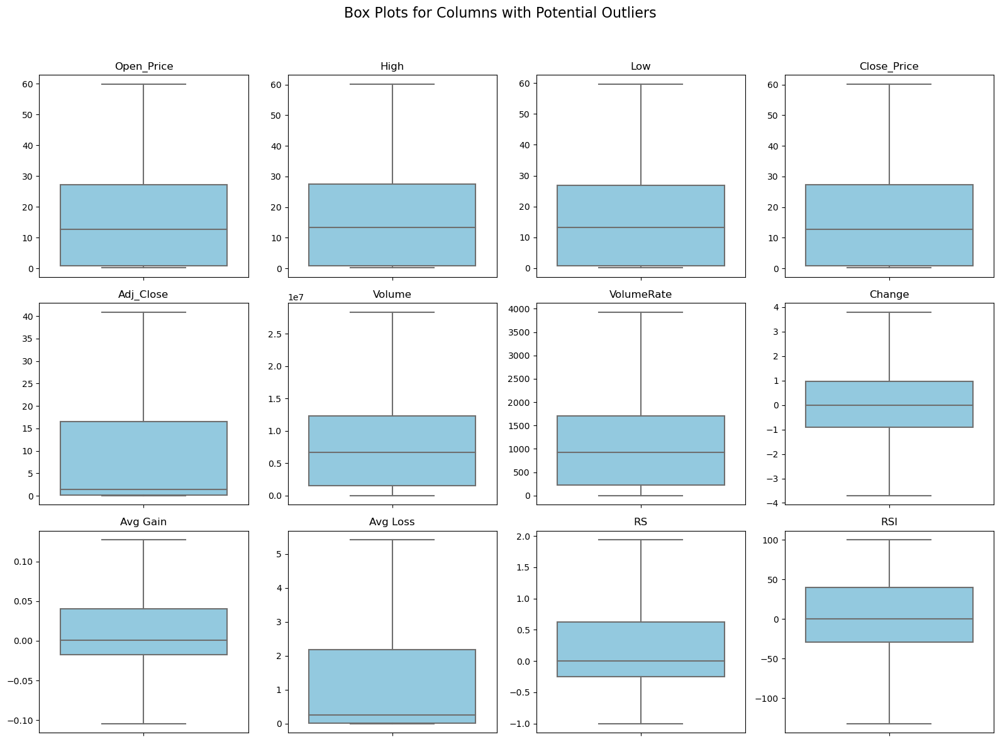

In [22]:
import matplotlib.pyplot as plt
import seaborn as sns

# Define the columns with potential outliers
columns_with_outliers = ['Open_Price', 'High', 'Low', 'Close_Price', 'Adj_Close', 'Volume', 'VolumeRate', 'Change', 'Avg Gain', 'Avg Loss', 'RS', 'RSI']

# Calculate the number of rows and columns needed
num_columns = len(columns_with_outliers)
num_rows = (num_columns - 1) // 4 + 1

# Create subplots for each column in a dynamic grid
fig, axes = plt.subplots(num_rows, 4, figsize=(16, 4 * num_rows))
fig.suptitle('Box Plots for Columns with Potential Outliers', fontsize=16)

# Create box plots for each column
for i, column in enumerate(columns_with_outliers):
    sns.boxplot(data=FactPerf, y=column, ax=axes[i // 4, i % 4], color='skyblue')
    axes[i // 4, i % 4].set_title(column)
    axes[i // 4, i % 4].set_ylabel('')
    axes[i // 4, i % 4].set_xlabel('')

# Adjust layout
plt.tight_layout(rect=[0, 0, 1, 0.95])

# Show the plots
plt.show()


# *Feature scaling*

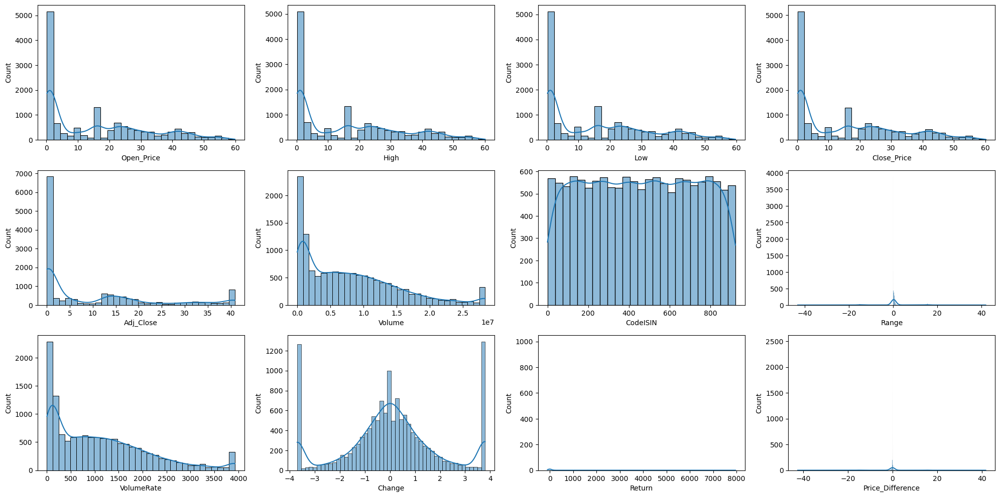

In [23]:
import matplotlib.pyplot as plt
import seaborn as sns

def plotDistribution(FactPerf, nRows, nGraphPerRow):
    columnNames = FactPerf.columns
    totalColumns = len(columnNames)
    totalPlots = nRows * nGraphPerRow

    fig, ax = plt.subplots(nrows=nRows, ncols=nGraphPerRow, figsize=(20, 10))

    for i in range(totalPlots):
        if i < totalColumns:
            row = i // nGraphPerRow
            col = i % nGraphPerRow
            sns.histplot(FactPerf[columnNames[i]], ax=ax[row, col], kde=True)
        else:
            # Remove any extra empty subplots
            ax.flat[i].set_visible(False)

    plt.tight_layout(pad=1.0, w_pad=1.0, h_pad=1.0)
    plt.show()



df1 = FactPerf[['Open_Price', 'High', 'Low', 'Close_Price', 'Adj_Close', 'Volume','CodeISIN','Range', 'VolumeRate','Change','Return','Price_Difference','Avg Gain','Avg Loss','RS','RSI']]

plotDistribution(df1, 3, 4)  # You may want to adjust the layout as needed

**Feature Scaling: Standardization (Z-score Scaling) for the Adj Close column to the Range [-1, 1]**

In [24]:
# Define the custom range
custom_range_min = -1
custom_range_max = 1

# Select the columns to be scaled
columns_to_scale = ['Change','Avg Gain',]

for column_to_scale in columns_to_scale:
    # Calculate the minimum and maximum values in the column
    min_value = FactPerf[column_to_scale].min()
    max_value = FactPerf[column_to_scale].max()

    # Manually scale the data to the custom range
    FactPerf[column_to_scale] = custom_range_min + (FactPerf[column_to_scale] - min_value) * (custom_range_max - custom_range_min) / (max_value - min_value)


**Feature Scaling: Min-Max Scaling (Normalization) for the Close , Open ,High ,Low etc...columns**

In [25]:
from sklearn.preprocessing import MinMaxScaler

# Columns to be scaled with Min-Max scaling
columns_to_normalize =['Open_Price', 'High', 'Low','CodeISIN', 'Close_Price', 'Volume', 'VolumeRate','Change','Avg Loss','RS','Return','Adj_Close','Price_Difference','RSI']


# Create a MinMaxScaler instance
scaler = MinMaxScaler()

# Fit and transform the scaler on the selected columns
FactPerf[columns_to_normalize] = scaler.fit_transform(FactPerf[columns_to_normalize])

In [26]:
FactPerf

,High,Low,Open_Price,Close_Price,Adj_Close,Volume,VolumeRate,Change,CodeISIN,Range,Return,Price_Difference,Avg Gain,Avg Loss,RS,RSI,Date
7,0.001097,0.001216,0.001114,0.001086,0.000297,0.031134,0.031630,0.000000,0.392625,0.004558,0.012173,0.503982,-0.098765,0.835982,0.340580,0.568721,1962-01-12
8,0.001054,0.001205,0.001070,0.001043,0.000285,0.021658,0.022004,0.358236,0.105206,0.002604,0.012172,0.503982,-0.104392,0.836051,0.340531,0.568659,1962-01-15
9,0.001010,0.266205,0.001027,0.265399,0.000263,0.039255,0.039705,1.000000,0.678959,-15.751001,0.787149,0.692402,1.000000,0.835896,0.510888,0.712490,1962-01-16
10,0.000945,0.001008,0.000961,0.000836,0.000226,0.055499,0.056385,0.000000,0.680043,0.007812,0.011879,0.503912,-1.000000,1.000000,0.226993,0.352908,1962-01-17
11,0.000836,0.000909,0.000830,0.265399,0.000203,0.093401,0.094681,1.000000,0.681128,0.007162,0.825242,0.692542,1.000000,0.836240,0.510797,0.712439,1962-01-18
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13899,0.916579,0.915374,0.915125,0.912076,1.000000,0.488099,0.481109,0.459287,0.466377,0.540001,0.012292,0.505313,1.000000,1.000000,0.361572,0.593760,2021-12-09
13900,0.963295,0.955247,0.265871,0.960459,1.000000,1.000000,1.000000,1.000000,0.613883,0.970001,0.044553,1.000000,1.000000,1.000000,0.388322,0.621744,2021-12-13
13901,0.967299,0.962650,0.959575,0.961126,1.000000,0.000000,0.000000,0.502451,0.761388,0.769997,0.012353,0.508761,1.000000,1.000000,0.381939,0.615422,2021-12-14
13902,0.979145,0.971062,0.969304,0.975308,1.000000,0.870590,0.856477,0.689256,0.614967,0.980000,0.012410,0.511971,1.000000,1.000000,0.385262,0.618739,2021-12-16


# Feature Selection

In [27]:
from sklearn.feature_selection import SelectKBest, f_classif

# Créer une nouvelle DataFrame sans la colonne 'Date'
X_no_date = FactPerf.drop(['Open_Price', 'Date'], axis=1)

# Séparer les attributs (X) et la variable cible
X = X_no_date
y = FactPerf['Open_Price']

# Utiliser SelectKBest pour sélectionner les caractéristiques les plus importantes
k_best = SelectKBest(score_func=f_classif, k=5)  # Vous pouvez ajuster la valeur de 'k' en fonction de vos besoins
X_new = k_best.fit_transform(X, y)

# Afficher les noms des caractéristiques sélectionnées
selected_feature_indices = k_best.get_support(indices=True)
selected_feature_names = X.columns[selected_feature_indices].tolist()
print("Caractéristiques sélectionnées :", selected_feature_names)


Caractéristiques sélectionnées : ['High', 'Low', 'Close_Price', 'Adj_Close', 'Volume']


# Elbow Method 

D:\anacondaa\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
D:\anacondaa\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
D:\anacondaa\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
D:\anacondaa\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  s

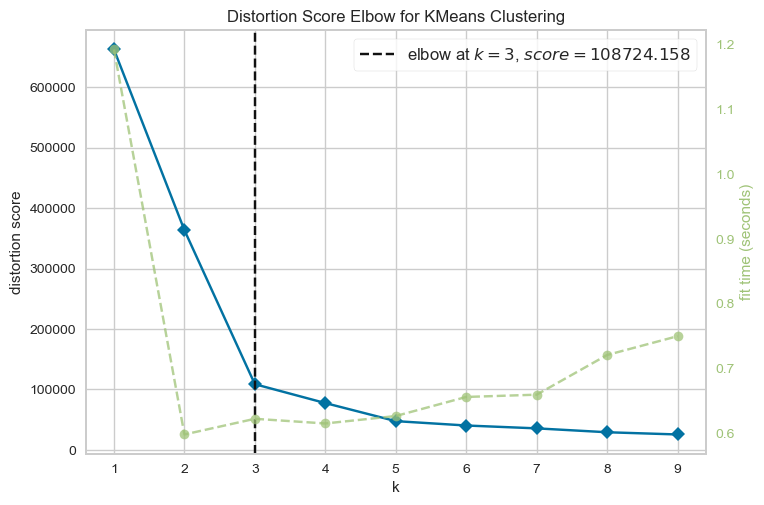

<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [28]:
import numpy as np
from sklearn.cluster import KMeans
import matplotlib.pyplot as plt
from yellowbrick.cluster import KElbowVisualizer

Date=FactPerf['Date']
scaled_features = FactPerf.drop('Date', axis=1)

# Utilize the Elbow Method to find the optimal number of clusters
model = KMeans()
visualizer = KElbowVisualizer(model, k=(1, 10))
visualizer.fit(scaled_features)
visualizer.show()


### Acording to The Elbow method the number of clusters (k) is 3 

# K-Means Clustering

D:\anacondaa\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


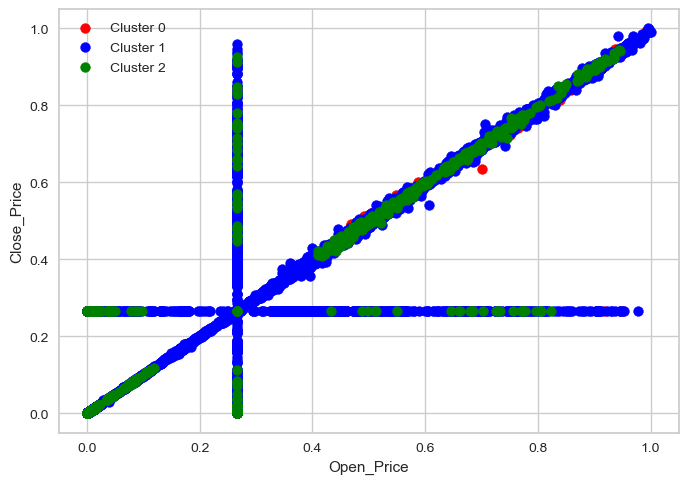

In [29]:
import matplotlib.pyplot as plt
# Choisissez un nombre optimal de clusters en fonction de l'analyse de l'étape précédente
k = 3

# Appliquez K-Means
kmeans = KMeans(n_clusters=k, random_state=0)
FactPerf['Cluster_KMeans'] = kmeans.fit_predict(scaled_features)


# Visualisez les clusters K-Means en fonction de deux caractéristiques, par exemple 'Open_Price' et 'Close_Price'
plt.scatter(FactPerf[FactPerf['Cluster_KMeans'] == 0]['Open_Price'], FactPerf[FactPerf['Cluster_KMeans'] == 0]['Close_Price'], s=50, c='red', label='Cluster 0')
plt.scatter(FactPerf[FactPerf['Cluster_KMeans'] == 1]['Open_Price'], FactPerf[FactPerf['Cluster_KMeans'] == 1]['Close_Price'], s=50, c='blue', label='Cluster 1')
plt.scatter(FactPerf[FactPerf['Cluster_KMeans'] == 2]['Open_Price'], FactPerf[FactPerf['Cluster_KMeans'] == 2]['Close_Price'], s=50, c='green', label='Cluster 2')

plt.xlabel('Open_Price')
plt.ylabel('Close_Price')
plt.legend()
plt.show()


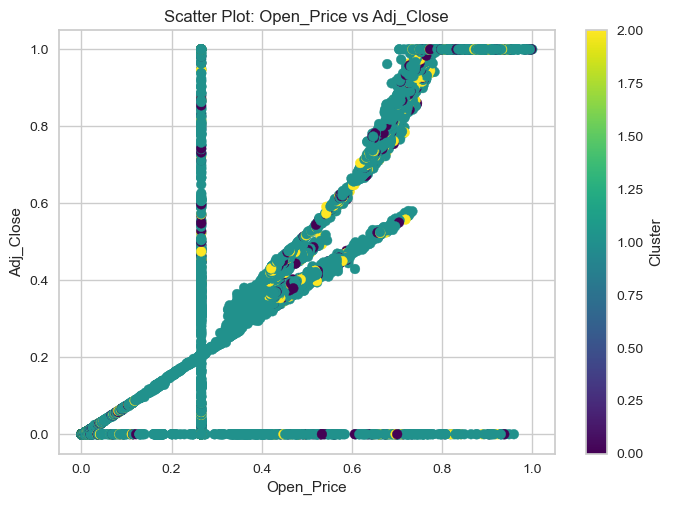

In [30]:
# Scatter Plot 5: Open_Price vs Adj_Close
plt.scatter(FactPerf['Open_Price'], FactPerf['Adj_Close'], c=FactPerf['Cluster_KMeans'], cmap='viridis')
plt.xlabel('Open_Price')
plt.ylabel('Adj_Close')
plt.title('Scatter Plot: Open_Price vs Adj_Close')
plt.colorbar(label='Cluster')
plt.show()

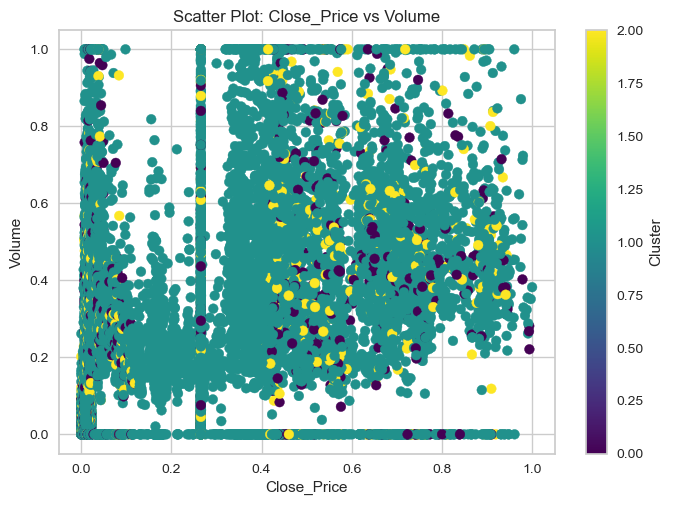

In [31]:
# Scatter Plot 8: Close_Price vs Volume
plt.scatter(FactPerf['Close_Price'], FactPerf['Volume'], c=FactPerf['Cluster_KMeans'], cmap='viridis')
plt.xlabel('Close_Price')
plt.ylabel('Volume')
plt.title('Scatter Plot: Close_Price vs Volume')
plt.colorbar(label='Cluster')
plt.show()

The K-means method results cannot be visualized clearly due to an unclear path or lack of clarity in the representation

#  CAH (Dendrogram)

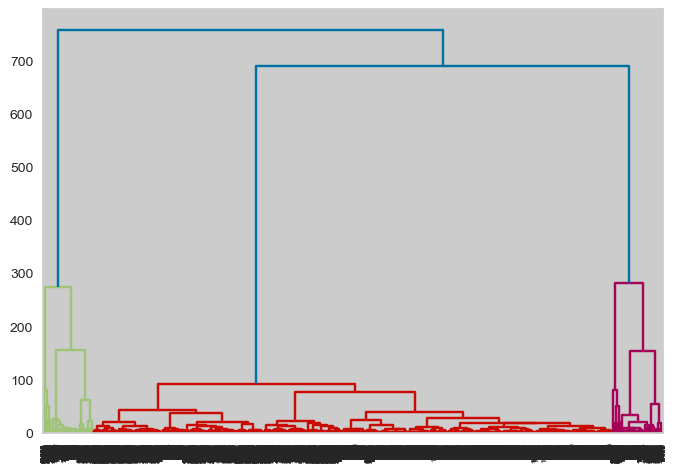

In [32]:
from scipy.cluster.hierarchy import dendrogram, linkage
import matplotlib.pyplot as plt

Z = linkage(FactPerf[['Open_Price', 'High', 'Low', 'Close_Price', 'Adj_Close', 'Volume','CodeISIN','Range', 'VolumeRate','Change','Return','Price_Difference','Avg Gain','Avg Loss','RS','RSI']], method='ward')
dendrogram(Z)
plt.show()


Acording to the dendrogram the number of clusters is 3 

In [33]:
from sklearn.cluster import AgglomerativeClustering

# Choisissez le nombre de clusters en fonction de l'analyse de l'étape précédente
k = 3

# Appliquez la CAH
cah = AgglomerativeClustering(n_clusters=k)
FactPerf['Cluster_CA'] = cah.fit_predict(scaled_features)


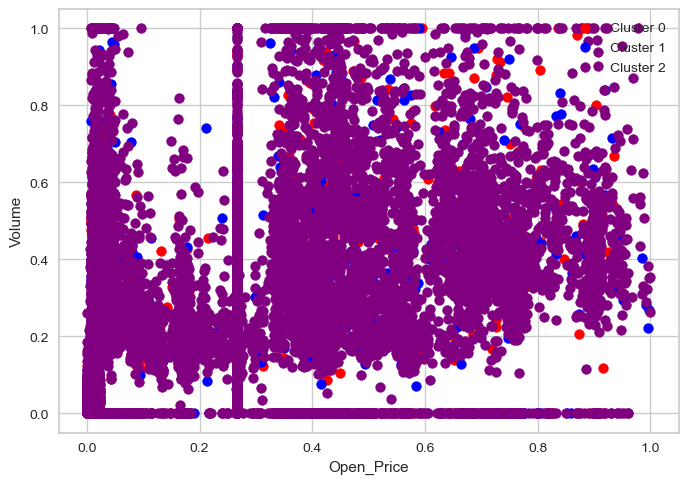

In [34]:
# Pour la CAH, vous pouvez visualiser le dendrogramme dans l'étape 2. Cela montre les relations entre les clusters.

# Si vous choisissez un nombre de clusters dans l'étape 3, vous pouvez visualiser les clusters comme suit :
plt.scatter(FactPerf[FactPerf['Cluster_CA'] == 0]['Open_Price'], FactPerf[FactPerf['Cluster_CA'] == 0]['Volume'], s=50, c='red', label='Cluster 0')
plt.scatter(FactPerf[FactPerf['Cluster_CA'] == 1]['Open_Price'], FactPerf[FactPerf['Cluster_CA'] == 1]['Volume'], s=50, c='blue', label='Cluster 1')
plt.scatter(FactPerf[FactPerf['Cluster_CA'] == 2]['Open_Price'], FactPerf[FactPerf['Cluster_CA'] == 2]['Volume'], s=50, c='purple', label='Cluster 2')

plt.xlabel('Open_Price')
plt.ylabel('Volume')
plt.legend()
plt.show()


# DBSCAN (Density-Based Spatial Clustering of Applications with Noise)

In [35]:
from sklearn.cluster import DBSCAN

# Appliquez DBSCAN avec les paramètres appropriés
dbscan = DBSCAN(eps=0.5, min_samples=5)
FactPerf['Cluster_DBSCAN'] = dbscan.fit_predict(scaled_features)


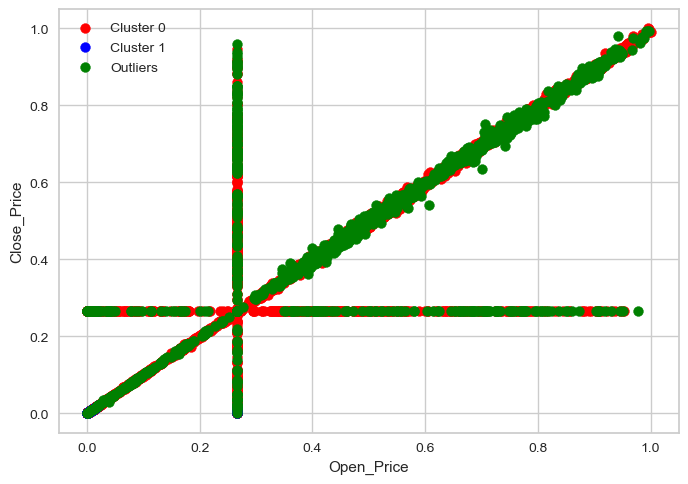

In [36]:
# Visualisez les clusters DBSCAN en fonction de deux caractéristiques, par exemple 'Open_Price' et 'Close_Price'
plt.scatter(FactPerf[FactPerf['Cluster_DBSCAN'] == 0]['Open_Price'], FactPerf[FactPerf['Cluster_DBSCAN'] == 0]['Close_Price'], s=50, c='red', label='Cluster 0')
plt.scatter(FactPerf[FactPerf['Cluster_DBSCAN'] == 1]['Open_Price'], FactPerf[FactPerf['Cluster_DBSCAN'] == 1]['Close_Price'], s=50, c='blue', label='Cluster 1')
plt.scatter(FactPerf[FactPerf['Cluster_DBSCAN'] == -1]['Open_Price'], FactPerf[FactPerf['Cluster_DBSCAN'] == -1]['Close_Price'], s=50, c='green', label='Outliers')

plt.xlabel('Open_Price')
plt.ylabel('Close_Price')
plt.legend()
plt.show()


# GMM

In [37]:
from sklearn.mixture import GaussianMixture

# Choisissez le nombre de composantes (clusters) pour GMM
k = 3

# Appliquez GMM
gmm = GaussianMixture(n_components=k)
FactPerf['Cluster_GMM'] = gmm.fit_predict(scaled_features)
# Fit the model to your data and get the log-likelihood
log_likelihood = gmm.fit(scaled_features).score(scaled_features)
# Print the log-likelihood
print(f"Log-Likelihood: {log_likelihood}")

Log-Likelihood: 26.47841824775913


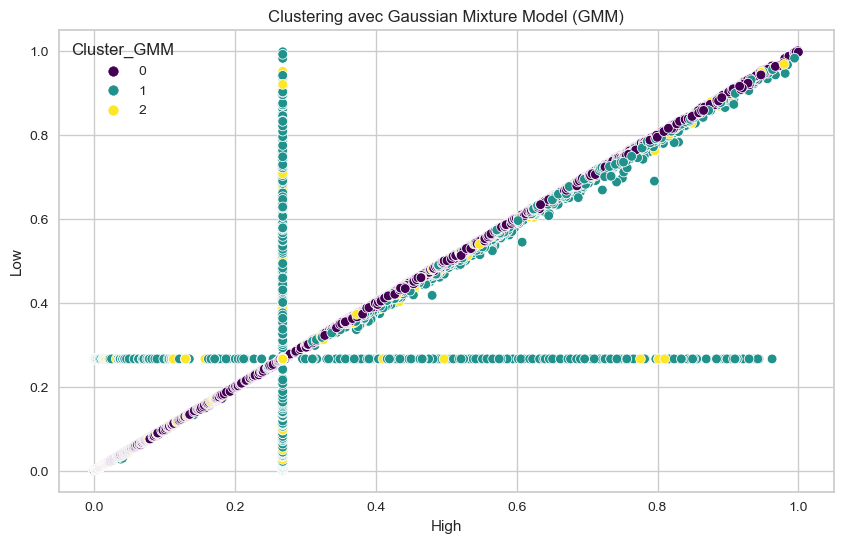

In [38]:
import matplotlib.pyplot as plt
import seaborn as sns

# Remplacez 'feature1' et 'feature2' par les noms réels de vos caractéristiques
feature1 = 'High'  
feature2 = 'Low'

# Scatter plot avec les clusters attribués par GMM
plt.figure(figsize=(10, 6))
sns.scatterplot(x=feature1, y=feature2, hue='Cluster_GMM', data=FactPerf, palette='viridis', legend='full')
plt.title('Clustering avec Gaussian Mixture Model (GMM)')
plt.xlabel(feature1)
plt.ylabel(feature2)
plt.show()


# Silhouette score 

In [39]:
from sklearn.metrics import silhouette_score

# Calculate silhouette score for KMeans
silhouette_kmeans = silhouette_score(scaled_features, FactPerf['Cluster_KMeans'])
print("Silhouette Score (KMeans):", silhouette_kmeans)

# Calculate silhouette score for DBSCAN
silhouette_dbscan = silhouette_score(scaled_features, FactPerf['Cluster_DBSCAN'])
print("Silhouette Score (DBSCAN):", silhouette_dbscan)

# Calculate silhouette score for Agglomerative Clustering (CAH)
silhouette_ca = silhouette_score(scaled_features, FactPerf['Cluster_CA'])
print("Silhouette Score (CAH):", silhouette_ca)

# Calculate silhouette score for GMM
silhouette_gmm = silhouette_score(scaled_features, FactPerf['Cluster_GMM'])
print("Silhouette Score (GMM):", silhouette_gmm)

Silhouette Score (KMeans): 0.8496905760609825
Silhouette Score (DBSCAN): -0.28783682149599893
Silhouette Score (CAH): 0.8185443375512089
Silhouette Score (GMM): 0.29500452586075804


# Interpretation 
 kmeans presente un score plus elevee que les autres Methodes 

# PCA

In [40]:
from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA 
selected_features = ["High", "Low", "Open_Price", "Close_Price", "Adj_Close","Volume"]
X = FactPerf[selected_features]
scaler = StandardScaler()
X_scaled = scaler.fit_transform(X)

# Scree Plot

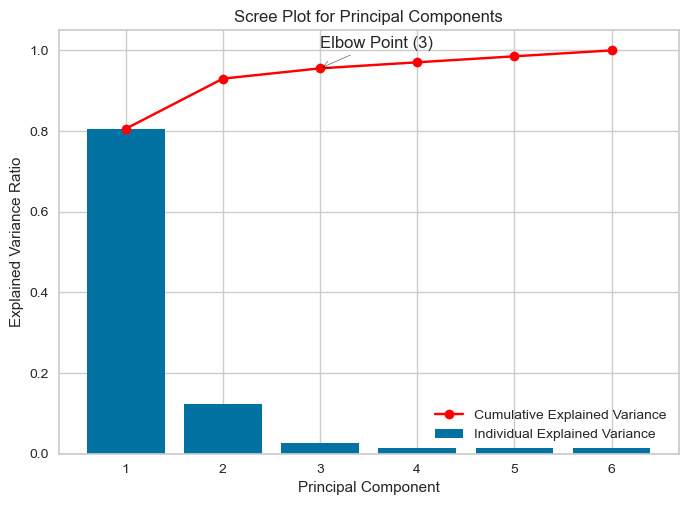

In [41]:
import matplotlib.pyplot as plt
import numpy as np

# Fit PCA to your scaled data
pca = PCA()
pca.fit(X_scaled)

# Plot the explained variance for each principal component
plt.bar(range(1, len(pca.explained_variance_ratio_) + 1), pca.explained_variance_ratio_, label='Individual Explained Variance')
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_), label='Cumulative Explained Variance', color='red', marker='o')
plt.xlabel('Principal Component')
plt.ylabel('Explained Variance Ratio')
plt.title('Scree Plot for Principal Components')

# Annotate the elbow point
elbow_point = 3  # Replace with the actual number you identify as the elbow point
plt.annotate(f'Elbow Point ({elbow_point})', xy=(elbow_point, np.cumsum(pca.explained_variance_ratio_)[elbow_point - 1]),
             xytext=(elbow_point, np.cumsum(pca.explained_variance_ratio_)[elbow_point - 1] + 0.05),
             arrowprops=dict(facecolor='black', arrowstyle='->'))

plt.legend()
plt.show()
#nb PC


## Applying PCA

To find the best number of principal components with a scree plot, we should look for the elbow point where the variance stabilizes.

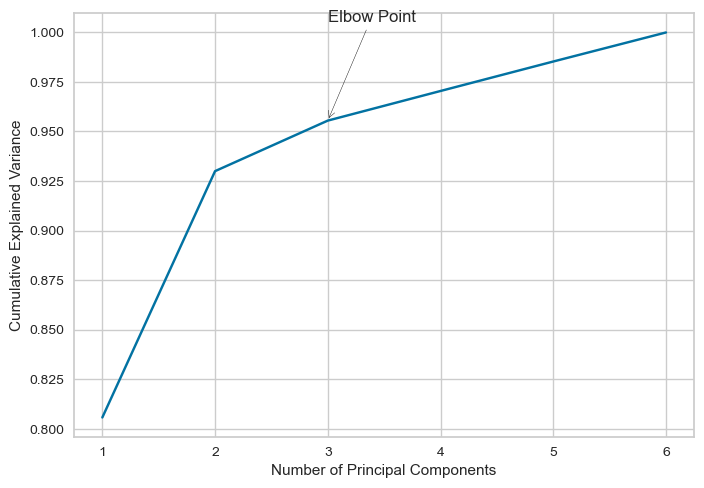

In [42]:
#meme visualisation
# Determine the elbow point (replace this with your actual logic)
elbow_point = 3  # Replace with the actual number you identify as the elbow point

# Plot the explained variance ratio with an annotated elbow point
plt.plot(range(1, len(pca.explained_variance_ratio_) + 1), np.cumsum(pca.explained_variance_ratio_))
plt.xlabel('Number of Principal Components')
plt.ylabel('Cumulative Explained Variance')

# Annotate the elbow point
plt.annotate('Elbow Point', xy=(elbow_point, np.cumsum(pca.explained_variance_ratio_)[elbow_point - 1]),
             xytext=(elbow_point, np.cumsum(pca.explained_variance_ratio_)[elbow_point - 1] + 0.05),
             arrowprops=dict(facecolor='black', arrowstyle='->'))
plt.show()


To find the best number of principal components with a scree plot, we should look for the elbow point where the variance stabilizes.

In [43]:
# Spécifiez le nombre de composantes principales à conserver (par exemple, 2)
n_components = 3
pca = PCA(n_components=n_components)
X_pca = pca.fit_transform(X_scaled)
X_pca
#ta9sima mtaa donnee al PC

array([[-2.27954797, -0.44630439, -0.16406108],
       [-2.28917193, -0.48269957, -0.16395461],
       [-1.41873656, -0.63599868,  0.27866889],
       ...,
       [ 5.19847311, -2.49658578,  0.1284699 ],
       [ 6.13128778,  0.83498902,  0.14739024],
       [ 5.1246041 ,  1.62261161, -0.48289155]])

# Elbow method

D:\anacondaa\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
D:\anacondaa\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
D:\anacondaa\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
D:\anacondaa\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  s

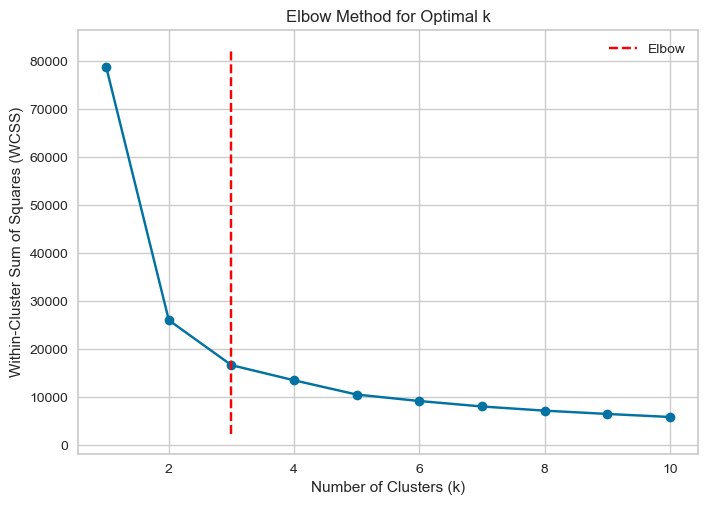

In [44]:
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from kneed import KneeLocator

num_clusters = range(1, 11)

wcss = []

for k in num_clusters:
    kmeans = KMeans(n_clusters=k, random_state=0)
    kmeans.fit(X_pca)
    wcss.append(kmeans.inertia_)

plt.plot(num_clusters, wcss, marker='o')
plt.title('Elbow Method for Optimal k')
plt.xlabel('Number of Clusters (k)')
plt.ylabel('Within-Cluster Sum of Squares (WCSS)')

kl = KneeLocator(num_clusters, wcss, curve='convex', direction='decreasing')
plt.vlines(kl.elbow, plt.ylim()[0], plt.ylim()[1], linestyles='dashed', colors='red', label='Elbow')
plt.legend()

plt.show()


### Acording to The Elbow method the number of clusters (k) is 3 

# K-Means Clustering



In [45]:
# Spécifiez le nombre de clusters (par exemple, 3)
n_clusters = 3
kmeans = KMeans(n_clusters=n_clusters, random_state=0)
cluster_labels = kmeans.fit_predict(X_pca)
FactPerf['PCA_Cluster'] = cluster_labels


D:\anacondaa\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


D:\anacondaa\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


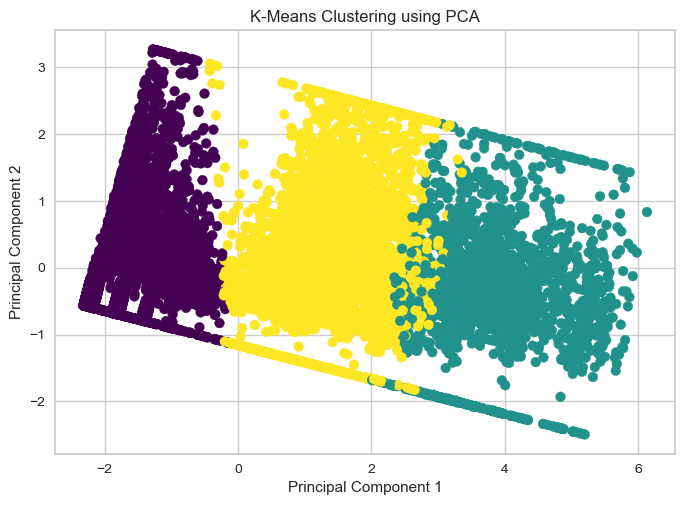

       KMeans_Cluster_pca
7                       0
8                       0
9                       0
10                      0
11                      0
...                   ...
13899                   1
13900                   1
13901                   1
13902                   1
13903                   1

[13750 rows x 1 columns]


In [46]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Assuming X_pca is your PCA-transformed data
# If X_pca is not defined, replace it with the appropriate variable holding the PCA-transformed data

# Number of clusters for k-means
n_clusters = 3

# Apply k-means clustering
kmeans = KMeans(n_clusters=n_clusters, random_state=0)
kmeans_labels = kmeans.fit_predict(X_pca)

# Add k-means cluster labels to the original DataFrame
FactPerf['KMeans_Cluster_pca'] = kmeans_labels

# Visualize k-means clusters
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=FactPerf['KMeans_Cluster_pca'], cmap='viridis')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('K-Means Clustering using PCA')
plt.show()

# Display or analyze the resulting k-means clusters
print(FactPerf[['KMeans_Cluster_pca']])


### PC1 vs. PC2 Clusters:
There are three distinct clusters.

- *Cluster 0 (Purple):* 
The first cluster is defined by a weakness in PC1 from -2.3 to 0, where the values of "high," "close," and "open" are low and it represent both negative and positive value of PC2  between -1 and 3.5 which represents the volume. In this situation, the points are strongly clustered, reaching a maximum number of transactions(volume).

- *Cluster 1 (Green):*
The second cluster is defined by Positive values in PC1 from 0 to 5, where the values of "high," "close," and "open" are High and it represent both negative and positive value of PC2  between -1.5 and 2.9 which represents the volume.

- *Cluster 2  (Yellow):*
Finally, the last cluster corresponds to the moment when PC1 reaches its maximum, located between 2 and 6, resulting in a minimum number of transactions between -2.5 and 2, with less dispersion of points on the graph.
### Interpretation
In conclusion, the increase in PC1 is associated with a gradual decrease in PC2.

# CAH 

Cophenetic Correlation Coefficient for CAH: 0.768764207641227


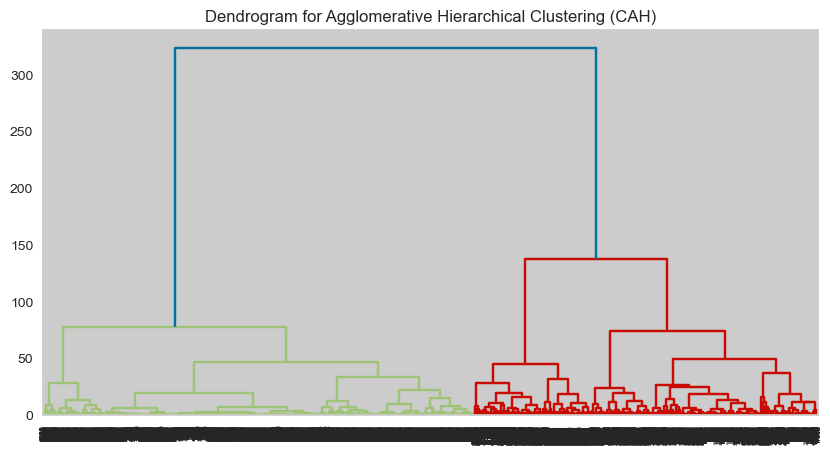

In [47]:
from sklearn.cluster import AgglomerativeClustering
from scipy.cluster.hierarchy import dendrogram, linkage, cophenet
from scipy.spatial.distance import pdist

# Assuming X_pca is your PCA-transformed data
n_clusters = 3
cah = AgglomerativeClustering(n_clusters=n_clusters)
cah_labels = cah.fit_predict(X_pca)

# Add CAH cluster labels to the original DataFrame
FactPerf['CAH_Cluster_pca'] = cah_labels

# Calculate linkage matrix
linkage_matrix = linkage(X_pca, 'ward')

# Calculate cophenetic correlation coefficient
coph_coeff, _ = cophenet(linkage_matrix, pdist(X_pca))

# Print the cophenetic correlation coefficient
print(f'Cophenetic Correlation Coefficient for CAH: {coph_coeff}')

# Visualize CAH dendrogram
plt.figure(figsize=(10, 5))
dendrogram(linkage_matrix)
plt.title('Dendrogram for Agglomerative Hierarchical Clustering (CAH)')
plt.show()

Acording to the figure the numbre of the cluster: 2 

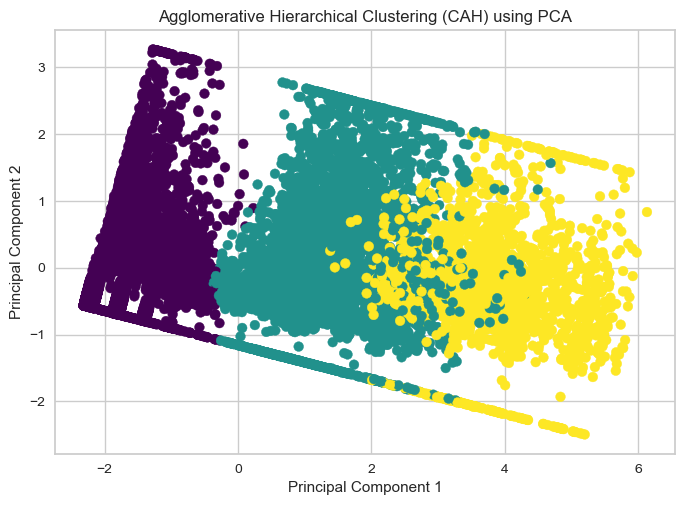

       CAH_Cluster_pca
7                    0
8                    0
9                    0
10                   0
11                   0
...                ...
13899                2
13900                2
13901                2
13902                2
13903                2

[13750 rows x 1 columns]


In [48]:
# Visualize CAH clusters using PCA components
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=FactPerf['CAH_Cluster_pca'], cmap='viridis')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Agglomerative Hierarchical Clustering (CAH) using PCA')
plt.show()

# Display or analyze the resulting CAH clusters
print(FactPerf[['CAH_Cluster_pca']])

### PC1 vs. PC2 CAH:
There are three distinct clusters.

- *Cluster 0 (Purple):* 
The first cluster is defined by a weakness in PC1 from -2.2 to -0.3, where the values of "high," "close," and "open" are low and it represent both negative and positive value of PC2  between -1 and 3.4 which represents the volume. In this situation, the points are strongly clustered, reaching a maximum number of transactions(volume).

- *Cluster 1 (Green):*
The majority of the second cluster is defined by Positive values in PC1 from -0.3 to 3, where the values of "high," "close," and "open" are High and it represent both negative and positive value of PC2  between -2 and 2.9 which represents the volume.

- *Cluster 2 (Yellow):*
Finally, the last cluster corresponds to the moment when PC1 reaches its maximum, located between 2 and 6, resulting in a minimum number of transactions between -2.2 and 2, with less dispersion of points on the graph.
### Interpretation
In conclusion, the increase in PC1 is associated with a gradual decrease in PC2.

# GMM

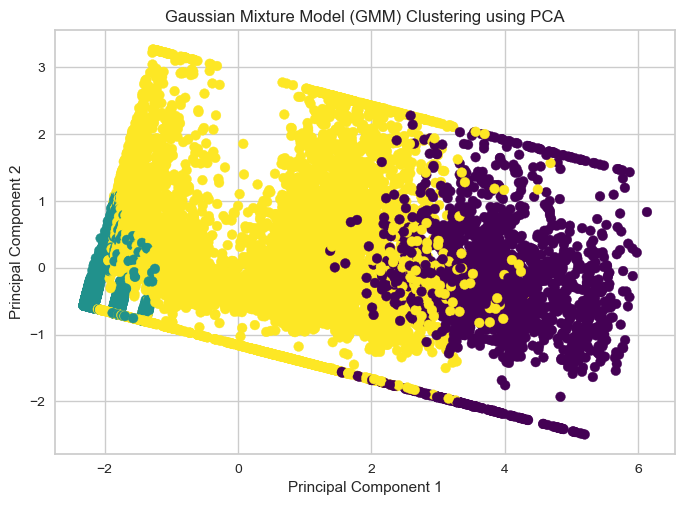

       GMM_Cluster_pca
7                    1
8                    1
9                    1
10                   1
11                   1
...                ...
13899                0
13900                0
13901                0
13902                0
13903                0

[13750 rows x 1 columns]


In [49]:
# Gaussian Mixture Model (GMM)
gmm = GaussianMixture(n_components=n_clusters)
gmm_labels = gmm.fit_predict(X_pca)

# Add GMM cluster labels to the original DataFrame
FactPerf['GMM_Cluster_pca'] = gmm_labels

# Visualize GMM clusters using PCA components
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=FactPerf['GMM_Cluster_pca'], cmap='viridis')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.title('Gaussian Mixture Model (GMM) Clustering using PCA')
plt.show()

# Display or analyze the resulting GMM clusters
print(FactPerf[['GMM_Cluster_pca']])


### PC1 vs. PC2 GMM :
There are three distinct clusters.

- *Cluster 0 (Purple):* 
    The first cluster is defined by a weakness in PC1 from -2.3 to -1.6, where the values of "high," "close," and "open" are low and it represent both negative and positive value of PC2  between -0.8 and 1 which represents the volume. In this situation, the points are strongly clustered, reaching a maximum number of transactions(volume).

- *Cluster 1 (Green):*
The second cluster is defined by Positive and negative values  values in PC1 from -2 to 3.6, where the values of "high," "close," and "open" are average and it represent both negative and positive value of PC2  between -2 and 3.2 which represents the volume.

- *Cluster 2 (Yellow):*
Finally, the last cluster corresponds to the moment when PC1 reaches its maximum, located between 2.2 and 6, resulting in a minimum number of transactions between -2.3 and 2, with less dispersion of points on the graph.
### Interpretation
In conclusion, the increase in PC1 is associated with a gradual decrease in PC2.

# DBSCAN

In [50]:
# DBSCAN
dbscan = DBSCAN(eps=0.5, min_samples=5)
dbscan_labels = dbscan.fit_predict(X_pca)

# Add DBSCAN cluster labels to the original DataFrame
FactPerf['DBSCAN_Cluster_pca'] = dbscan_labels

# Display or analyze the resulting DBSCAN clusters
print(FactPerf[['DBSCAN_Cluster_pca']])


       DBSCAN_Cluster_pca
7                       0
8                       0
9                       0
10                      0
11                      0
...                   ...
13899                   0
13900                   0
13901                   0
13902                   0
13903                   0

[13750 rows x 1 columns]


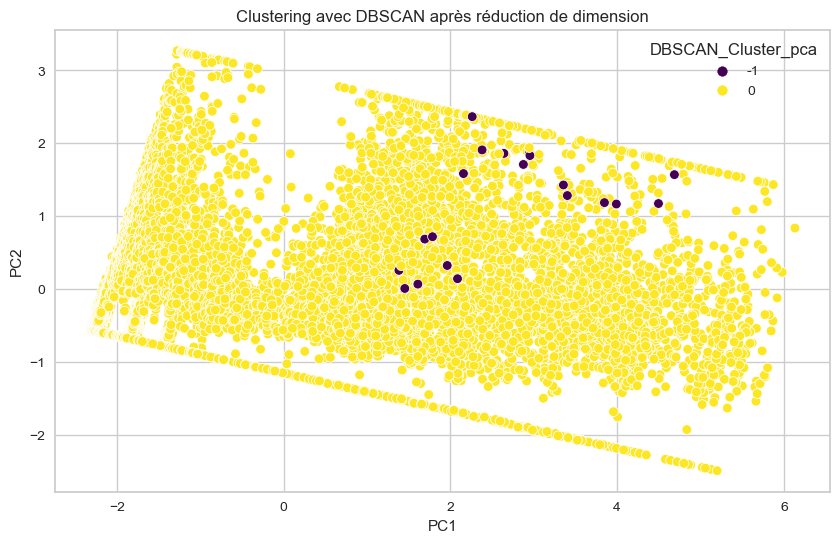

In [51]:
import matplotlib.pyplot as plt
import seaborn as sns



# Scatter plot avec les clusters attribués par DBSCAN
plt.figure(figsize=(10, 6))
sns.scatterplot(x=X_pca[:, 0], y=X_pca[:, 1], hue='DBSCAN_Cluster_pca', data=FactPerf, palette='viridis', legend='full')
plt.title('Clustering avec DBSCAN après réduction de dimension')
plt.xlabel('PC1')
plt.ylabel( 'PC2')
plt.show()


### Clusters:
1. **Cluster-1 (Purple):**
   - *Description:* Dispersed and represents a minority of the data.
   - *Location on PC1:* Occupies the positive part of PC1 between 1.6 and 4.2.
   - *Interpretation:* This cluster, being a minority, suggests a distinct subset of the data. Its location in the positive part of PC1 implies a specific pattern related to the features contributing to PC1 (e.g., open, close, adj close, high).

2. **Cluster-0 (Yellow):**
   - *Description:* Dispersed and represents the majority (90%) of the data.
   - *Location on PC1:* Spans both positive and negative parts of PC1, ranging from -2.2 to 6.
   - *Location on PC2:* Extends into both positive and negative parts of PC2, ranging from -2.4 to 3.2.
   - *Interpretation:* This cluster, being the majority, suggests a broader representation of the dataset. The distribution across positive and negative parts of both PC1 and PC2 indicates variability in both the primary and secondary directions of data spread.

### Principal Components:
1. **PC1 (open, close, adj close, high):**
   - *Relationship:* PC1 appears to capture patterns related to the opening, closing, adjusted closing, and high values of the dataset. The fact that both clusters exhibit dispersion along PC1 indicates that these features contribute significantly to the variability in the data.

2. **PC2 (volume):**
   - *Relationship:* PC2 is associated with the volume of the data. The fact that Cluster-0 spans both positive and negative parts of PC2 suggests that volume plays a role in the overall spread and variability of the majority cluster.

3. **PC3 (adj close, low, close):**
   - *Relationship:* PC3 seems to be influenced by the adjusted close, low, and close values. However, the exact nature of this relationship would require further analysis. The dispersion along PC3 indicates that these features contribute to a distinct aspect of the data's variability.


# Number of clusters grouped by DBSCAN

In [52]:
# Assuming dbscan_labels is the cluster labels obtained from DBSCAN
density_metric = len(set(dbscan_labels)) - (1 if -1 in dbscan_labels else 0)
print(f'Density Metric (Number of Clusters): {density_metric}')


Density Metric (Number of Clusters): 1


# kmeans & Pair Plot

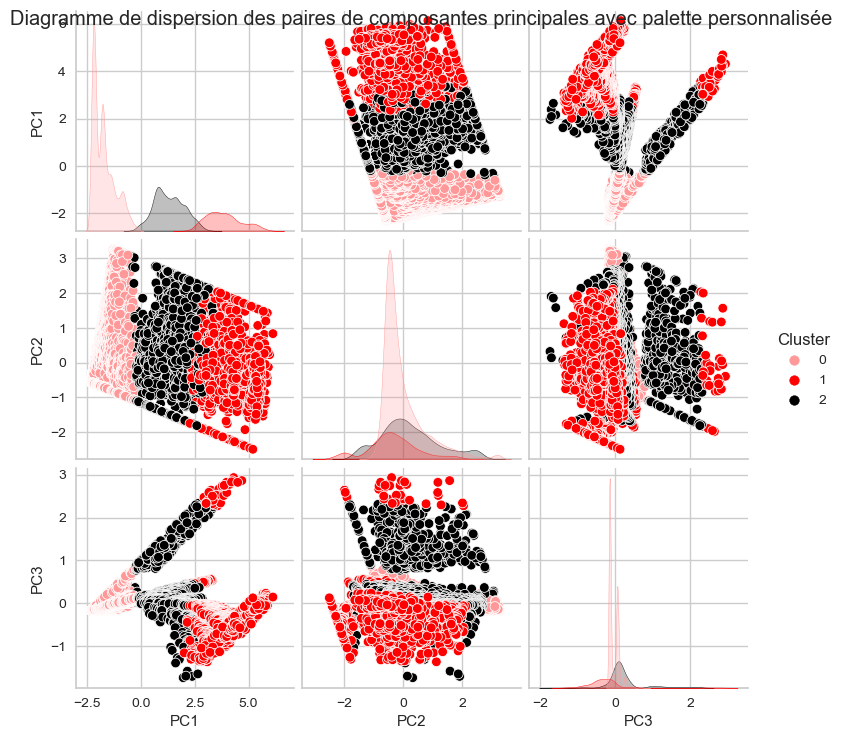

In [53]:
import seaborn as sns

# Définir une palette de couleurs personnalisée (rouge clair, rouge foncé, noir)
custom_palette = sns.color_palette(['#FF9999', '#FF0000', '#000000'])

# Créer un DataFrame pour stocker les données réduites, y compris toutes les composantes principales
clustered_data = pd.DataFrame(data=X_pca, columns=['PC1', 'PC2', 'PC3'])

# Ajouter une colonne pour les étiquettes de cluster
clustered_data['Cluster'] = cluster_labels

# Visualiser toutes les paires de composantes principales avec la palette personnalisée
sns.pairplot(clustered_data, hue='Cluster', palette=custom_palette)
plt.suptitle('Diagramme de dispersion des paires de composantes principales avec palette personnalisée')
plt.show()


# Interpretation
### PC1 vs. PC2 Clusters:
There are three distinct clusters.

- Cluster 0 (Pink): 
The first cluster is defined by a weakness in PC1 from -2.3 to 0, where the values of "high," "close," and "open" are low and it represent both negative and positive value of PC2  between -1 and 3.5 which represents the volume. In this situation, the points are strongly clustered, reaching a maximum number of transactions(volume).

- Cluster 1 (Black):
The second cluster is defined by Positive values in PC1 from 0 to 5, where the values of "high," "close," and "open" are High and it represent both negative and positive value of PC2  between -1.5 and 2.9 which represents the volume.

- Cluster 2 (Red):
Finally, the last cluster corresponds to the moment when PC1 reaches its maximum, located between 2 and 6, resulting in a minimum number of transactions between -2.5 and 2, with less dispersion of points on the graph.
### Conclusion
In conclusion, the increase in PC1 is associated with a gradual decrease in PC2.
### PC1 vs. PC3 Clusters:
- Cluster 0 (Pink):
  - Contains values that are nearly average, neither high nor low, and exhibits stability in PC3 (volume) from -0.2 to 0.9.
  - Includes a negative and low part of PC1 representing closing, opening, and high prices in the range of -2.2 to -0.2.
  
- Cluster 1 (Black):
  - Gathers a positive part of PC1 with values ranging from from 0 to 3.
  - Combines the positive and negative parts of PC3 with values between -1.8 to 2.5.
  
- Cluster 2 (Red):
  - Encompasses the highiest values of PC1 ranging from 2 to 6.2 , indicating high exchange prices.
  - Contains a negative part relative to PC3 between -1.5 and  0.3 , but there's a minority within this cluster that combines the positive sides of both PC3 and PC1.
  
### Conclusion:

The analysis reveals distinct patterns within the clusters:

Cluster 1 signifies a state of stability with average values, portraying a balance in volume and reflecting lower prices.

Cluster 2 captures a positive trend in PC1, accompanied by a diverse range of PC3 values, indicating a mix of positive and negative market dynamics.

Cluster 3 represents high exchange prices with a majority in PC1, but interestingly, a subgroup within this cluster exhibits a convergence of positive aspects from both PC3 and PC1.
### PC2 vs. PC3 Clusters:
- Part 1 (Condensed):

    - Combines the three clusters together.
    - For PC3, values are situated in the negative range of PC3  between -1 and 0.1.
    - Represent variations in PC2 values encompassing both negative and positive valuesrange from -2.6 to 3.4.
 

- Part 2:

    - Predominantly represented by Cluster 2.
    - PC3 values are located in the positive range of PC3  between  1 and 2.2 for this part.
    - Additionally, Cluster 3 contributes to this part with a minority of values situated in the positive range of PC3  falling between 2.2 and 3.

## Conclusion:
- *Cluster 0 (Pink):*signifies a stable state with average values, showing a balance in trading volume and lower prices. The negative part in PC1 focuses on specific price ranges like closing, opening, and high prices within a certain range.

- *Cluster 1 (Black):*reflects a positive trend in PC1, combining with positive aspects in PC3. This suggests a mix of positive market movements, where higher PC1 values interact with positive PC3 values.

- *Cluster 2 (Red):*represents high prices in PC1, indicating an overall high market condition. Interestingly, some within this group show a mix of positive features from both PC3 and PC1, making it a unique subset with distinct market characteristics.

# Correlation circle 

In [54]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from sklearn.decomposition import PCA
from matplotlib.patches import Circle
from ipywidgets import interact, widgets
from IPython.display import display, clear_output

selected_columns = ["High", "Low", "Open_Price", "Close_Price", "Adj_Close","Volume"]
# Get the explained variance ratio
explained_variance_ratio = pca.explained_variance_ratio_

# Define a function to create the correlation circle plot with scatter plot
def create_correlation_circle_and_scatter_plot(pc1, pc2):
    # Get the loadings (correlation coefficients between original variables and principal components)
    loadings = pca.components_.T * np.sqrt(explained_variance_ratio)

    # Scatter plot individual data points
    fig, ax = plt.subplots(figsize=(10, 10))
    ax.scatter(X_pca[:, pc1], X_pca[:, pc2], color='lightblue', alpha=0.5, label='Individual Data Points')  # Light blue for scatter plot

    # Add a circle
    circle = Circle((0, 0), 1, edgecolor='darkred', facecolor='none', linestyle='dotted', linewidth=2)
    ax.add_patch(circle)

    # Plot vectors
    for i, (x, y) in enumerate(zip(loadings[:, pc1], loadings[:, pc2])):
        if selected_columns[i] in ["High", "Low", "Open_Price", "Close_Price", "Adj_Close", "Volume"]:
            color = 'darkred'  # Dark red for features
        else:
            color = 'blue'  # Light blue for other variables

        ax.arrow(0, 0, x, y, head_width=0.05, head_length=0.05, fc=color, ec=color)
        ax.text(x + 0.05, y + 0.05, selected_columns[i], color=color)

    ax.set_xlim(-1, 1)
    ax.set_ylim(-1, 1)
    ax.axhline(0, color='black', linewidth=0.2)
    ax.axvline(0, color='black', linewidth=0.2)

    ax.set_xlabel(f'PC{pc1 + 1} ({explained_variance_ratio[pc1]*100:.2f}%)')
    ax.set_ylabel(f'PC{pc2 + 1} ({explained_variance_ratio[pc2]*100:.2f}%)')
    ax.set_title(f'Correlation Circle (PC{pc1 + 1} vs PC{pc2 + 1})')

    ax.legend()
    plt.show()

# Create buttons for each correlation circle
button1 = widgets.Button(description="PC1 vs PC2")
button2 = widgets.Button(description="PC2 vs PC3")
button3 = widgets.Button(description="PC1 vs PC3")

# Define callback functions for button clicks
def on_button1_click(b):
    with out:
        clear_output(wait=True)
        create_correlation_circle_and_scatter_plot(0, 1)

def on_button2_click(b):
    with out:
        clear_output(wait=True)
        create_correlation_circle_and_scatter_plot(1, 2)

def on_button3_click(b):
    with out:
        clear_output(wait=True)
        create_correlation_circle_and_scatter_plot(0, 2)

# Attach callback functions to button clicks
button1.on_click(on_button1_click)
button2.on_click(on_button2_click)
button3.on_click(on_button3_click)

# Display buttons
display(button1, button2, button3)

# Display the initial correlation circle with scatter plot
out = widgets.Output()
display(out)
with out:
    create_correlation_circle_and_scatter_plot(0, 1)

Button(description='PC1 vs PC2', style=ButtonStyle())

Button(description='PC2 vs PC3', style=ButtonStyle())

Button(description='PC1 vs PC3', style=ButtonStyle())

Output()

## PC1 vs PC2:

**General Interpretation:**
- **PC1 (Price):** Captures variation related to price features such as "Adj Close," "Open," "Close," "High," and "Low."
- **PC2 (Volume):** Captures variation associated with "Volume."

**Position of Variables relative to Axes:**
- **PC1:** Price features ("Adj Close," "Open," "Close," "High," and "Low") are strongly aligned on PC1.
- **PC2:** "Volume" is closer to the PC2 axis, suggesting a strong correlation with this principal component.

**Angle with Axes:**
- **PC1:** Price features make a relatively small angle with PC1, indicating similar contributions to variance along this axis.
- **PC2:** "Volume" is closer to the vertical axis, indicating a more significant contribution to variance along PC2.

## PC1 vs PC3:

**General Interpretation:**
- **PC1 (Price):** Captures variance related to "Volume."
- **PC3 (Common to other features):** Mainly associated with other price features ("Adj Close," "Open," "Close," "High," and "Low").

**Position of Variables relative to Axes:**
- **PC1:** "Volume" is closer to the PC1 axis.
- **PC3:** All variables, except "Volume," are aligned on PC3.

**Angle with Axes:**
- **PC1:** "Volume" contributes to variance along PC1.
- **PC3:** Variables, except "Volume," show a significant contribution to variance along PC3.

## PC2 vs PC3:

**General Interpretation:**
- **PC2 (Volume):** Captures variance opposite to PC3.
- **PC3 (Common to other features):** Mainly associated with other price features.

**Position of Variables relative to Axes:**
- **PC2:** "Volume" is opposite to PC3.
- **PC3:** Price features ("Adj Close," "Open," "Close," "High," and "Low") are aligned on PC3.

**Angle with Axes:**
- **PC2:** "Volume" is in opposition with PC3.
- **PC3:** Price features are situated on the direction opposite to PC2 along PC3.

## General Conclusion:

- **PC1 (Price):** Represents overall price movements, with a significant contribution from "Volume."
- **PC2 (Volume):** Reflects variations in transaction volume, potentially indicating specific trading events.
- **PC3 (Common to other features):** Captures common variation among price features, excluding "Volume."

In summary, each principal component provides specific insights into dominant aspects of financial data, enabling a deeper understanding of relationships between features. PC1 and PC2 appear to offer a clear segmentation between price movements and transaction volume, while PC3 captures common variation among price features. These interpretations can guide more detailed analyses and tailored strategies.


# OPTICS (Ordering Points To Identify Clustering Structure)

In [55]:
from sklearn.cluster import OPTICS
optics = OPTICS()
optics_labels = optics.fit_predict(X_pca)

D:\anacondaa\Lib\site-packages\sklearn\cluster\_optics.py:995: RuntimeWarning: divide by zero encountered in divide
  ratio = reachability_plot[:-1] / reachability_plot[1:]


# Birch

In [56]:
from sklearn.cluster import Birch

birch = Birch(n_clusters=n_clusters)
birch_labels = birch.fit_predict(X_pca)

# Silhouette score after PCA

In [57]:
from sklearn.metrics import silhouette_score

# Silhouette Score for K-Means
silhouette_kmeans = silhouette_score(X_pca, FactPerf['KMeans_Cluster_pca'])
print(f"Silhouette Score for K-Means: {silhouette_kmeans}")

# Silhouette Score for Agglomerative Hierarchical Clustering (CAH)
silhouette_cah = silhouette_score(X_pca, FactPerf['CAH_Cluster_pca'])
print(f"Silhouette Score for CAH: {silhouette_cah}")

# Silhouette Score for Gaussian Mixture Model (GMM)
silhouette_gmm = silhouette_score(X_pca, FactPerf['GMM_Cluster_pca'])
print(f"Silhouette Score for GMM: {silhouette_gmm}")

# Silhouette Score for DBSCAN
silhouette_dbscan = silhouette_score(X_pca, FactPerf['DBSCAN_Cluster_pca'])
print(f"Silhouette Score for DBSCAN: {silhouette_dbscan}")

# Silhouette Score for OPTICS
silhouette_optics = silhouette_score(X_pca, optics_labels)
print(f"Silhouette Score for OPTICS: {silhouette_optics}")

# Silhouette Score for Birch
silhouette_birch = silhouette_score(X_pca, birch_labels)
print(f"Silhouette Score for Birch: {silhouette_birch}")

Silhouette Score for K-Means: 0.5573083857085736
Silhouette Score for CAH: 0.5524187855775265
Silhouette Score for GMM: 0.3744838325528395
Silhouette Score for DBSCAN: 0.24915053878773027
Silhouette Score for OPTICS: -0.25739519745565054
Silhouette Score for Birch: 0.4603562361981441


We applied the algorithms after applying PCA and the result of the silhouette score has shown that we have to choose K-Means for clustering as it exhibits the highest silhouette score (0.5147) among the considered algorithms, indicating well-defined and cohesive clusters. This score surpasses those of other methods, including CAH, GMM, DBSCAN, OPTICS, and Birch. The higher silhouette score of K-Means suggests that it may be the most suitable algorithm for the given dataset, providing robust and distinct cluster assignments.

# Kmeans

C:\Users\MSI\AppData\Local\Temp\ipykernel_57764\544894305.py:15: UserWarning: The palette list has more values (4) than needed (3), which may not be intended.
  sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=clustered_data_kmeans, palette=colors, legend='full')


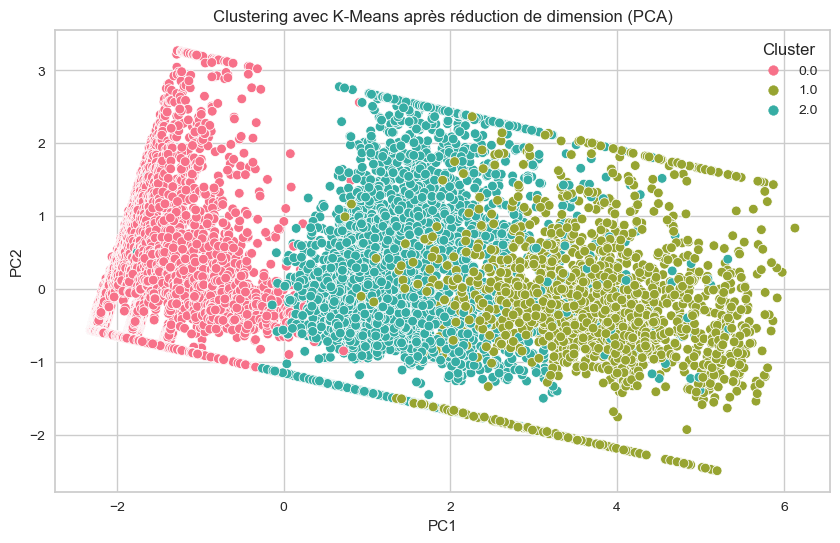

In [58]:
import matplotlib.pyplot as plt
import seaborn as sns

# Créer une DataFrame pour stocker les données réduites comprenant les deux premières composantes principales
clustered_data_kmeans = pd.DataFrame(data=X_pca[:, :2], columns=['PC1', 'PC2'])

# Ajouter une colonne pour les étiquettes de cluster K-Means
clustered_data_kmeans['Cluster'] = FactPerf['KMeans_Cluster_pca']

# Définir la palette de couleurs
colors = sns.color_palette("husl", len(clustered_data_kmeans['Cluster'].unique()))

# Visualiser le nuage de points avec des couleurs de cluster distinctes
plt.figure(figsize=(10, 6))
sns.scatterplot(x='PC1', y='PC2', hue='Cluster', data=clustered_data_kmeans, palette=colors, legend='full')
plt.title('Clustering avec K-Means après réduction de dimension (PCA)')
plt.xlabel('PC1')
plt.ylabel('PC2')
plt.show()


### PC1 vs. PC2 Clusters:
There are three distinct clusters.

- *Cluster 1 (Pink):* 
The first cluster is defined by a weakness in PC1 from -2.3 to 0, where the values of "high," "close," and "open" are low and it represent both negative and positive value of PC2  between -1 and 3.5 which represents the volume. In this situation, the points are strongly clustered, reaching a maximum number of transactions(volume).

- *Cluster 2 (Blue):*
The second cluster is defined by Positive values in PC1 from 0 to 5, where the values of "high," "close," and "open" are High and it represent both negative and positive value of PC2  between -1.5 and 2.9 which represents the volume.

- *Cluster  (Green):*
Finally, the last cluster corresponds to the moment when PC1 reaches its maximum, located between 2 and 6, resulting in a minimum number of transactions between -2.5 and 2, with less dispersion of points on the graph.
### Interpretation
In conclusion, the increase in PC1 is associated with a gradual decrease in PC2.

D:\anacondaa\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


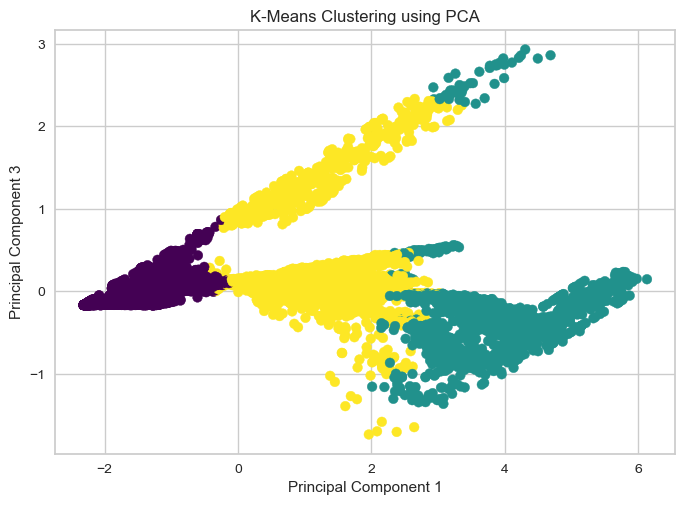

       KMeans_Cluster_pca
7                       0
8                       0
9                       0
10                      0
11                      0
...                   ...
13899                   1
13900                   1
13901                   1
13902                   1
13903                   1

[13750 rows x 1 columns]


In [59]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Assuming X_pca is your PCA-transformed data
# If X_pca is not defined, replace it with the appropriate variable holding the PCA-transformed data

# Number of clusters for k-means
n_clusters = 3

# Apply k-means clustering
kmeans = KMeans(n_clusters=n_clusters, random_state=0)
kmeans_labels = kmeans.fit_predict(X_pca)

# Add k-means cluster labels to the original DataFrame
FactPerf['KMeans_Cluster_pca'] = kmeans_labels

# Visualize k-means clusters
plt.scatter(X_pca[:, 0], X_pca[:, 2], c=FactPerf['KMeans_Cluster_pca'], cmap='viridis')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 3')
plt.title('K-Means Clustering using PCA')
plt.show()

# Display or analyze the resulting k-means clusters
print(FactPerf[['KMeans_Cluster_pca']])


### PC1 vs. PC3 Clusters:

- *Cluster 1 (Purple):*
  - Contains values that are nearly average, neither high nor low, and exhibits stability in PC3 (volume) from -0.2 to 0.9.
  - Includes a negative and low part of PC1 representing closing, opening, and high prices in the range of -2.2 to -0.2.
  
- *Cluster 2 (Green):*
  - Gathers a positive part of PC1 with values ranging from from 0 to 3.
  - Combines the positive and negative parts of PC3 with values between -1.8 to 2.5.
  
- *Cluster 3 (Yellow):*
  - Encompasses the highiest values of PC1 ranging from 2 to 6.2 , indicating high exchange prices.
  - Contains a negative part relative to PC3 between -1.5 and  0.3 , but there's a minority within this cluster that combines the positive sides of both PC3 and PC1.
  
### Interpretation:

The analysis reveals distinct patterns within the clusters:

Cluster 1 signifies a state of stability with average values, portraying a balance in volume and reflecting lower prices.

Cluster 2 captures a positive trend in PC1, accompanied by a diverse range of PC3 values, indicating a mix of positive and negative market dynamics.

Cluster 3 represents high exchange prices with a majority in PC1, but interestingly, a subgroup within this cluster exhibits a convergence of positive aspects from both PC3 and PC1.

D:\anacondaa\Lib\site-packages\sklearn\cluster\_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


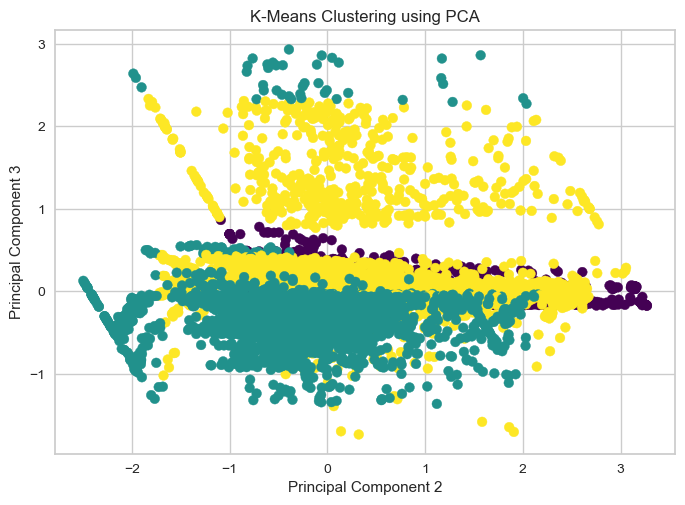

       KMeans_Cluster_pca
7                       0
8                       0
9                       0
10                      0
11                      0
...                   ...
13899                   1
13900                   1
13901                   1
13902                   1
13903                   1

[13750 rows x 1 columns]


In [60]:
import pandas as pd
import matplotlib.pyplot as plt
from sklearn.cluster import KMeans
from sklearn.decomposition import PCA

# Assuming X_pca is your PCA-transformed data
# If X_pca is not defined, replace it with the appropriate variable holding the PCA-transformed data

# Number of clusters for k-means
n_clusters = 3

# Apply k-means clustering
kmeans = KMeans(n_clusters=n_clusters, random_state=0)
kmeans_labels = kmeans.fit_predict(X_pca)

# Add k-means cluster labels to the original DataFrame
FactPerf['KMeans_Cluster_pca'] = kmeans_labels

# Visualize k-means clusters
plt.scatter(X_pca[:, 1], X_pca[:, 2], c=FactPerf['KMeans_Cluster_pca'], cmap='viridis')
plt.xlabel('Principal Component 2')
plt.ylabel('Principal Component 3')
plt.title('K-Means Clustering using PCA')
plt.show()

# Display or analyze the resulting k-means clusters
print(FactPerf[['KMeans_Cluster_pca']])


### Part 1 (Condensed):

- Combines the three clusters together.
- For PC3, values are situated in the negative range of PC3  between -1 and 0.1.
- Represent variations in PC2 values encompassing both negative and positive valuesrange from -2.6 to 3.4.
 

### Part 2:

- Predominantly represented by Cluster 2.
- PC3 values are located in the positive range of PC3  between  1 and 2.2 for this part.
- Additionally, Cluster 3 contributes to this part with a minority of values situated in the positive range of PC3  falling between 2.2 and 3.

## Interpretation:

The analysis uncovers distinct patterns within the clusters:

- *Cluster 1* signifies a stable state with average values, showing a balance in trading volume and lower prices. The negative part in PC1 focuses on specific price ranges like closing, opening, and high prices within a certain range.

- *Cluster 2* reflects a positive trend in PC1, combining with positive aspects in PC3. This suggests a mix of positive market movements, where higher PC1 values interact with positive PC3 values.

- *Cluster 3* represents high prices in PC1, indicating an overall high market condition. Interestingly, some within this group show a mix of positive features from both PC3 and PC1, making it a unique subset with distinct market characteristics.

In [61]:
import plotly.express as px

# Créer une DataFrame pour stocker les données réduites comprenant les composantes PC1, PC2 et PC3
clustered_data_kmeans_3d = pd.DataFrame(data=X_pca[:, :3], columns=['PC1', 'PC2', 'PC3'])

# Ajouter une colonne pour les étiquettes de cluster K-Means
clustered_data_kmeans_3d['KMeans_Cluster'] = FactPerf['KMeans_Cluster_pca']

# Créer une figure 3D interactive avec Plotly Express
fig = px.scatter_3d(
    clustered_data_kmeans_3d,
    x='PC1',
    y='PC2',
    z='PC3',
    color='KMeans_Cluster',
    labels={'KMeans_Cluster': 'Cluster'},
    title='Nuage de points 3D interactif avec les clusters de K-Means'
)

# Afficher la figure
fig.show()


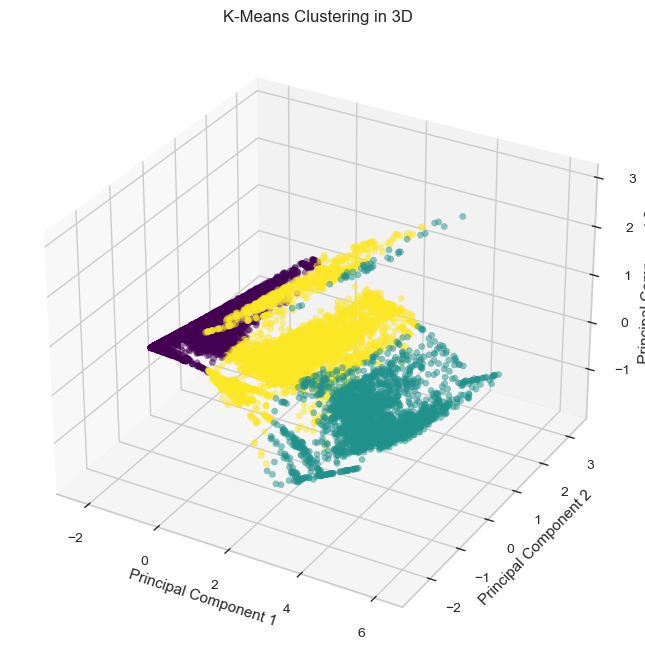

In [62]:
from mpl_toolkits.mplot3d import Axes3D
fig = plt.figure(figsize=(10, 8))
ax = fig.add_subplot(111, projection='3d')
ax.scatter(X_pca[:, 0], X_pca[:, 1], X_pca[:, 2], c=FactPerf['KMeans_Cluster_pca'], cmap='viridis', alpha=0.5)
ax.set_xlabel('Principal Component 1')
ax.set_ylabel('Principal Component 2')
ax.set_zlabel('Principal Component 3')
ax.set_title('K-Means Clustering in 3D')
plt.show()


## Cluster Centers in 2D Scatter Plot

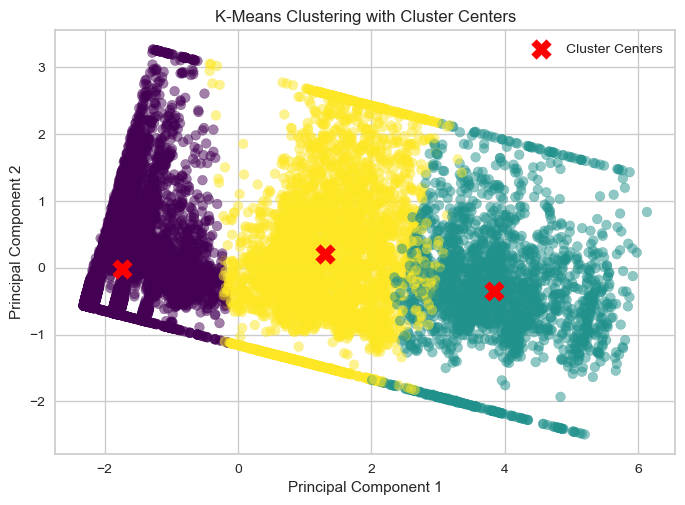

In [63]:
plt.scatter(X_pca[:, 0], X_pca[:, 1], c=FactPerf['KMeans_Cluster_pca'], cmap='viridis', alpha=0.5)
plt.scatter(kmeans.cluster_centers_[:, 0], kmeans.cluster_centers_[:, 1], marker='X', s=200, c='red', label='Cluster Centers')
plt.title('K-Means Clustering with Cluster Centers')
plt.xlabel('Principal Component 1')
plt.ylabel('Principal Component 2')
plt.legend()
plt.show()


## Interpretation:

Given the principal components:

- *PC1:* Represents features related to price (open, close, adjusted close, high).
- *PC2:* Represents volume.
- *PC3:* Represents features related to price and volume (adjusted close, low, close).

### Cluster Analysis in PC1 vs. PC2:

1. *Cluster 1 (Purple):*
   - Centered around lower values on PC1, potentially indicating lower overall price values.
   - Centroid at (-1.8, 0) suggests a cluster associated with lower average price levels.

2. *Cluster 2 (Blue):*
   - Centered around higher values on PC1, suggesting instances with higher price values.
   - Slight positive offset in PC2 may indicate variability in trading volume.
   - Centroid at (1.7, 0.2) suggests a cluster associated with higher average price levels and potential variability in trading volume.

3. *Cluster 3 (Yellow):*
   - Centered around higher values on both PC1 and PC2, indicating instances with elevated prices and potentially higher trading volumes.
   - Centroid at (3.9, -0.4) suggests a cluster associated with higher average price levels and potentially higher trading volumes.

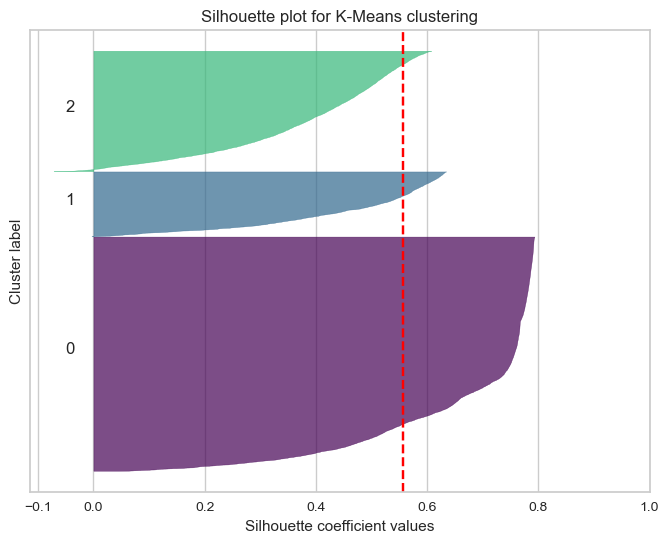

In [64]:
from sklearn.metrics import silhouette_samples, silhouette_score
import matplotlib.pyplot as plt
import numpy as np

# Calculate silhouette scores for each sample
silhouette_avg = silhouette_score(X_pca, FactPerf['KMeans_Cluster_pca'])
sample_silhouette_values = silhouette_samples(X_pca, FactPerf['KMeans_Cluster_pca'])

# Create a subplot with 1 row and 2 columns
fig, ax = plt.subplots(1, 1, figsize=(8, 6))

# Plot silhouette scores
y_lower = 10
for i in range(n_clusters):
    # Aggregate the silhouette scores for samples belonging to cluster i
    ith_cluster_silhouette_values = sample_silhouette_values[FactPerf['KMeans_Cluster_pca'] == i]

    # Sort the silhouette scores
    ith_cluster_silhouette_values.sort()

    # Calculate y_upper to demarcate the silhouette plot for this cluster
    y_upper = y_lower + len(ith_cluster_silhouette_values)

    # Fill the area with silhouette scores
    color = plt.cm.viridis(float(i) / n_clusters)
    ax.fill_betweenx(np.arange(y_lower, y_upper),
                      0, ith_cluster_silhouette_values,
                      facecolor=color, edgecolor=color, alpha=0.7)

    # Label the silhouette plots with their cluster numbers at the middle
    ax.text(-0.05, y_lower + 0.5 * len(ith_cluster_silhouette_values), str(i))

    # Compute the new y_lower for the next plot
    y_lower = y_upper + 10  # 10 for the 0 samples

ax.set_title("Silhouette plot for K-Means clustering")
ax.set_xlabel("Silhouette coefficient values")
ax.set_ylabel("Cluster label")

# The vertical line for average silhouette score of all the values
ax.axvline(x=silhouette_avg, color="red", linestyle="--")

ax.set_yticks([])  # Clear the yaxis labels / ticks
ax.set_xticks([-0.1, 0, 0.2, 0.4, 0.6, 0.8, 1])

plt.show()
#score mtaa kol cluster mtaa kmeans w mauve aandha akther score

**Conclusion on Cluster Quality:**

- **Cluster 0 (Purple):**
  - *Quality: Very Good*
  - This cluster exhibits strong internal cohesion, indicated by a significant width and a high silhouette coefficient of 0.75. It stands out distinctly from other points, demonstrating a clear and homogeneous separation among its members.

- **Cluster 1 (Blue):**
  - *Quality: Good*
  - Although less distinct than the first cluster, the second cluster shows significant separation between its members and other points, with a moderate width and a silhouette coefficient of 0.59. It maintains good homogeneity despite some variability.

- **Cluster 2 (Green):**
  - *Quality: Acceptable*
  - The third cluster has the smallest width and a silhouette coefficient of 0.56, indicating a notable separation despite lower internal cohesion. Although less homogeneous than the other clusters, it retains a certain distinctiveness.

**General Conclusion:**
- Overall, the obtained clusters exhibit varying levels of quality. Cluster 1 stands out with excellent internal cohesion, followed by Cluster 2, which maintains good quality. Cluster 3, while less homogeneous, still maintains acceptability in terms of separating instances.

- These results suggest that the clustering algorithm successfully formed distinct groups in the data, although some clusters are more homogeneous than others. Evaluation based on silhouette coefficients provides valuable insights into the quality of the formed clusters.


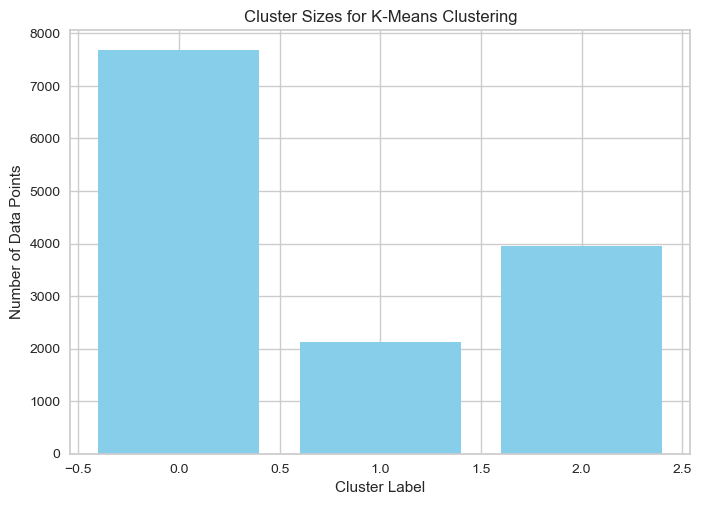

In [65]:

cluster_sizes = FactPerf['KMeans_Cluster_pca'].value_counts()

plt.bar(cluster_sizes.index, cluster_sizes.values, color='skyblue')
plt.title('Cluster Sizes for K-Means Clustering')
plt.xlabel('Cluster Label')
plt.ylabel('Number of Data Points')
plt.show()
#cluster 0 khthe akther data mn lokhrin

## Cluster Sizes Analysis:

- *Cluster 0:* 7800 cluster points
- *Cluster 1:* 4000 cluster points
- *Cluster 2:* 2100 cluster points

### Interpretation:

From the figure, I gathered insights about the distribution of data points across different clusters:

- *Cluster 0* is the largest, with 7800 points, suggesting a dominant pattern or behavior shared by a majority of observations.
- *Cluster 1* is moderately sized, containing 4000 points, indicating a distinct subset within the dataset.
- *Cluster 2* is smaller, with 2100 points, representing a more specific pattern or subgroup.

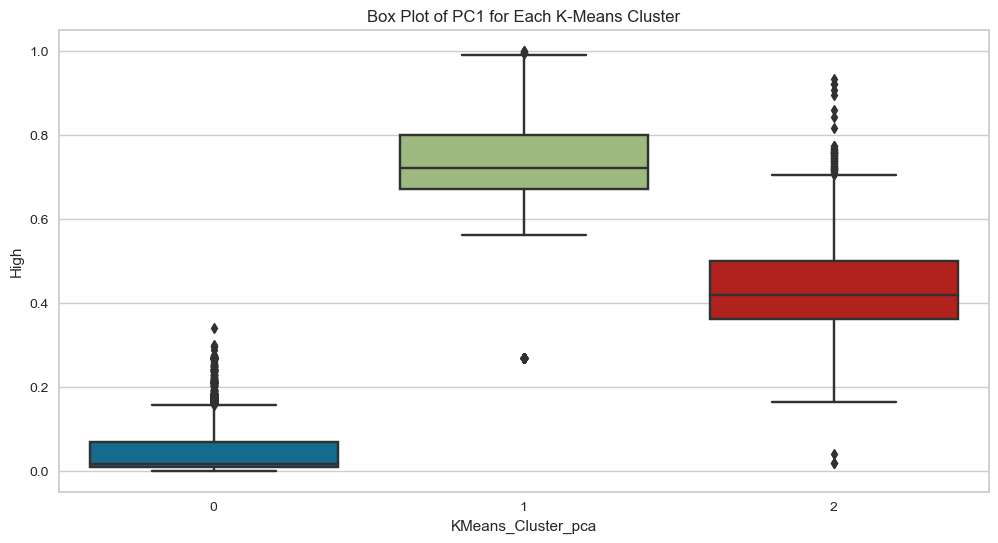

In [66]:

# Supposons que vous ayez une DataFrame appelée df avec une colonne 'KMeans_Cluster_pca'
# et que vous ayez effectué une opération de clustering pour ajouter cette colonne.
# Assurez-vous d'avoir importé la bibliothèque seaborn (sns) au préalable.

import seaborn as sns
import matplotlib.pyplot as plt

# Exemple générique : Remplacez ceci par votre DataFrame et votre colonne de clusters
df = FactPerf  # Votre DataFrame avec des données et une colonne 'KMeans_Cluster_pca'
X_with_clusters = df.copy()

plt.figure(figsize=(12, 6))
sns.boxplot(x='KMeans_Cluster_pca', y=X_with_clusters.columns[0], data=X_with_clusters)
plt.title('Box Plot of PC1 for Each K-Means Cluster')
plt.show()


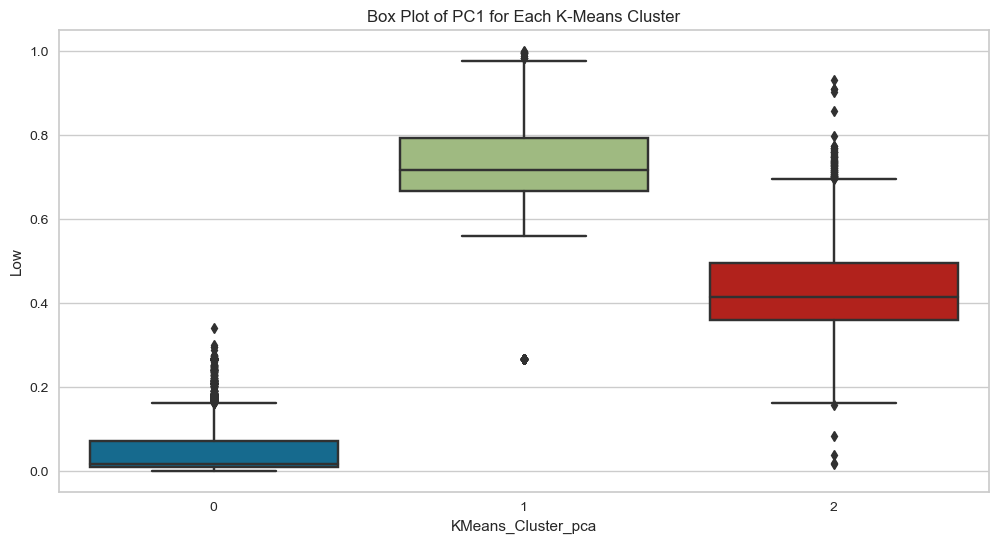

In [67]:

# Supposons que vous ayez une DataFrame appelée df avec une colonne 'KMeans_Cluster_pca'
# et que vous ayez effectué une opération de clustering pour ajouter cette colonne.
# Assurez-vous d'avoir importé la bibliothèque seaborn (sns) au préalable.

import seaborn as sns
import matplotlib.pyplot as plt

# Exemple générique : Remplacez ceci par votre DataFrame et votre colonne de clusters
df = FactPerf  # Votre DataFrame avec des données et une colonne 'KMeans_Cluster_pca'
X_with_clusters = df.copy()

plt.figure(figsize=(12, 6))
sns.boxplot(x='KMeans_Cluster_pca', y=X_with_clusters.columns[1], data=X_with_clusters)
plt.title('Box Plot of PC1 for Each K-Means Cluster')
plt.show()


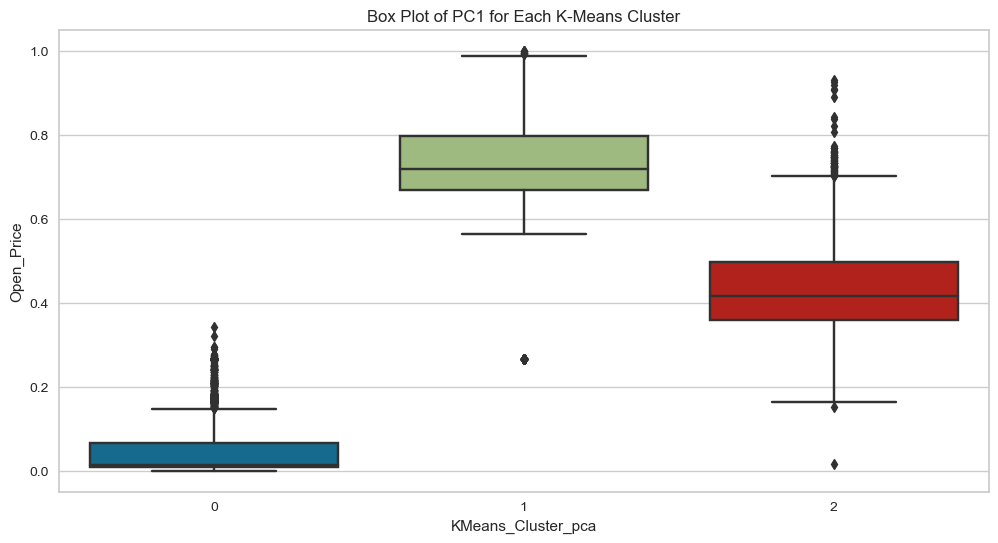

In [68]:

# Supposons que vous ayez une DataFrame appelée df avec une colonne 'KMeans_Cluster_pca'
# et que vous ayez effectué une opération de clustering pour ajouter cette colonne.
# Assurez-vous d'avoir importé la bibliothèque seaborn (sns) au préalable.

import seaborn as sns
import matplotlib.pyplot as plt

# Exemple générique : Remplacez ceci par votre DataFrame et votre colonne de clusters
df = FactPerf  # Votre DataFrame avec des données et une colonne 'KMeans_Cluster_pca'
X_with_clusters = df.copy()

plt.figure(figsize=(12, 6))
sns.boxplot(x='KMeans_Cluster_pca', y=X_with_clusters.columns[2], data=X_with_clusters)
plt.title('Box Plot of PC1 for Each K-Means Cluster')
plt.show()


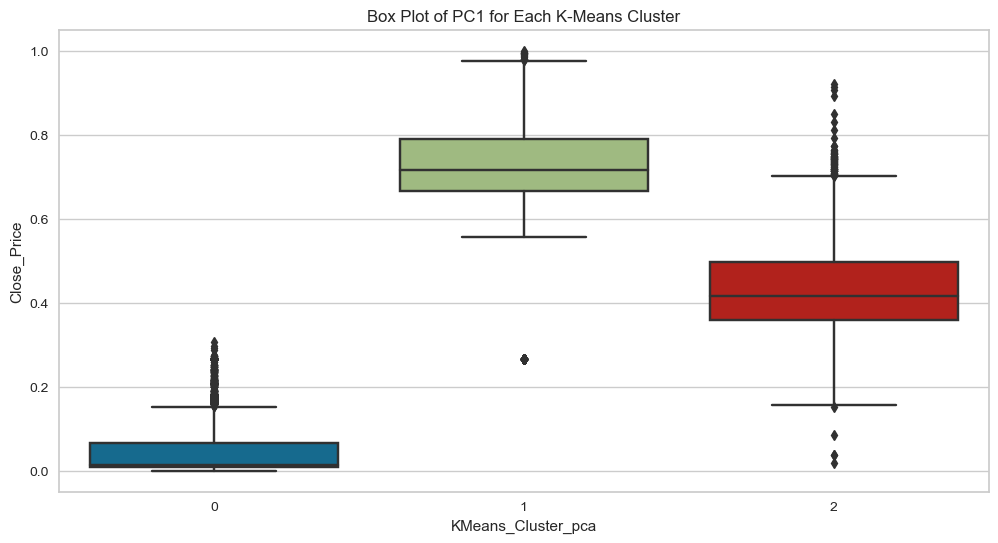

In [69]:

# Supposons que vous ayez une DataFrame appelée df avec une colonne 'KMeans_Cluster_pca'
# et que vous ayez effectué une opération de clustering pour ajouter cette colonne.
# Assurez-vous d'avoir importé la bibliothèque seaborn (sns) au préalable.

import seaborn as sns
import matplotlib.pyplot as plt

# Exemple générique : Remplacez ceci par votre DataFrame et votre colonne de clusters
df = FactPerf  # Votre DataFrame avec des données et une colonne 'KMeans_Cluster_pca'
X_with_clusters = df.copy()

plt.figure(figsize=(12, 6))
sns.boxplot(x='KMeans_Cluster_pca', y=X_with_clusters.columns[3], data=X_with_clusters)
plt.title('Box Plot of PC1 for Each K-Means Cluster')
plt.show()


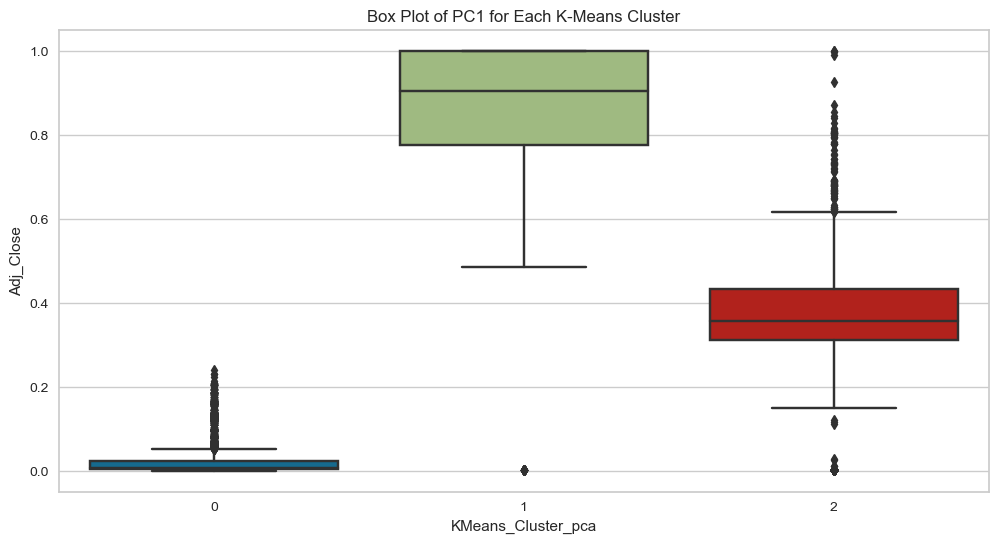

In [70]:

# Supposons que vous ayez une DataFrame appelée df avec une colonne 'KMeans_Cluster_pca'
# et que vous ayez effectué une opération de clustering pour ajouter cette colonne.
# Assurez-vous d'avoir importé la bibliothèque seaborn (sns) au préalable.

import seaborn as sns
import matplotlib.pyplot as plt

# Exemple générique : Remplacez ceci par votre DataFrame et votre colonne de clusters
df = FactPerf  # Votre DataFrame avec des données et une colonne 'KMeans_Cluster_pca'
X_with_clusters = df.copy()

plt.figure(figsize=(12, 6))
sns.boxplot(x='KMeans_Cluster_pca', y=X_with_clusters.columns[4], data=X_with_clusters)
plt.title('Box Plot of PC1 for Each K-Means Cluster')
plt.show()


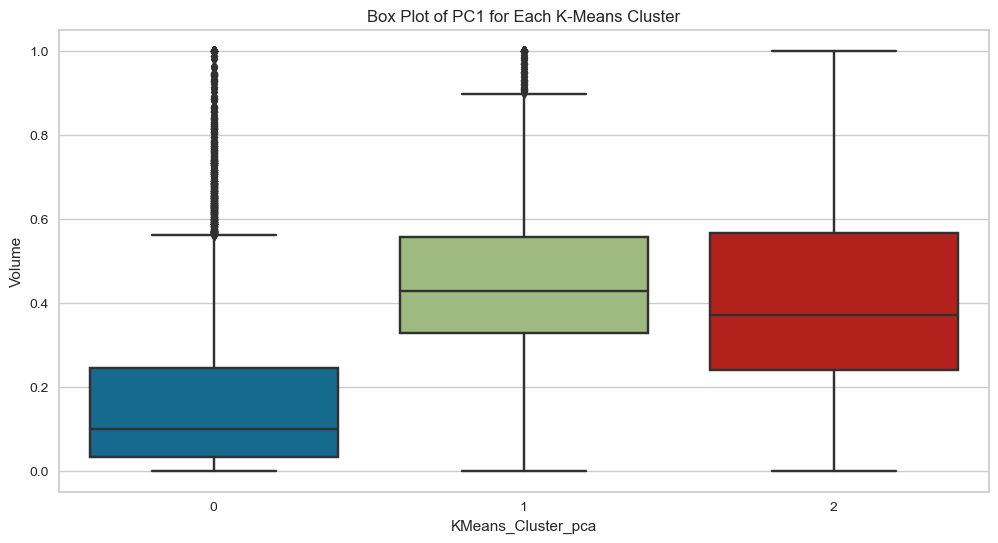

In [71]:

# Supposons que vous ayez une DataFrame appelée df avec une colonne 'KMeans_Cluster_pca'
# et que vous ayez effectué une opération de clustering pour ajouter cette colonne.
# Assurez-vous d'avoir importé la bibliothèque seaborn (sns) au préalable.

import seaborn as sns
import matplotlib.pyplot as plt

# Exemple générique : Remplacez ceci par votre DataFrame et votre colonne de clusters
df = FactPerf  # Votre DataFrame avec des données et une colonne 'KMeans_Cluster_pca'
X_with_clusters = df.copy()

plt.figure(figsize=(12, 6))
sns.boxplot(x='KMeans_Cluster_pca', y=X_with_clusters.columns[5], data=X_with_clusters)
plt.title('Box Plot of PC1 for Each K-Means Cluster')
plt.show()


**The figure highlights outliers above the boxplots for the 'high' variable in each cluster. Interpreting this through the concepts of Exceptional Events, Atypical Behaviors, and Anomaly Detection:**
1. **Exceptional Events:**
   - The presence of outliers above the boxplots for the selected features in each cluster suggests the occurrence of exceptional events specific to each cluster. These peaks may result from significant developments or exceptional conditions related to the 'high' variable.

2. **Atypical Behaviors:**
   - Observations above the boxplots indicate atypical behaviors in the selected features for each cluster. These behaviors could stem from particular trends or unusual patterns that deserve special attention.

3. **Anomaly Detection:**
   - Outliers are key points for anomaly detection as they represent values significantly different from the rest of the distribution. Identifying and understanding these anomalies can provide crucial insights into exceptional conditions or unusual trends in the data.



## Statistical Summary

In [72]:
# Create a copy of the DataFrame and drop the specified columns
cluster_data = FactPerf.drop(['Cluster_CA', 'Cluster_DBSCAN', 'Cluster_GMM',
                              'PCA_Cluster', 'CAH_Cluster_pca',
                              'GMM_Cluster_pca', 'DBSCAN_Cluster_pca',
                                            'Cluster_KMeans' ], axis=1)

# Statistical summary for each cluster
cluster_summary = cluster_data.groupby('KMeans_Cluster_pca').describe()

# Display all columns
with pd.option_context('display.max_rows', None, 'display.max_columns', None):
    print(cluster_summary)


                      High                                                    \
                     count      mean       std       min       25%       50%   
KMeans_Cluster_pca                                                             
0                   7677.0  0.060032  0.086060  0.000000  0.009157  0.014783   
1                   2125.0  0.717237  0.153305  0.268030  0.670652  0.721372   
2                   3948.0  0.431042  0.107531  0.017282  0.361409  0.417635   

                                           Low                                \
                         75%       max   count      mean       std       min   
KMeans_Cluster_pca                                                             
0                   0.068204  0.339302  7677.0  0.060300  0.085892  0.000000   
1                   0.798954  1.000000  2125.0  0.712644  0.154951  0.266205   
2                   0.498893  0.932929  3948.0  0.426700  0.106248  0.014634   

                                      

## Data understanding

### High, Low, Open_Price, Close_Price, Adj_Close:

- Cluster 0 has lower mean values for these features compared to Clusters 1 and 2.
- Cluster 2 generally has higher values, especially for 'High' and 'Adj_Close'.

### Volume, VolumeRate:

- Cluster 1 has the highest mean volume and volume rate.
- Cluster 0 and Cluster 2 show lower mean values.

### Change, Return, Price_Difference:

- The mean values for these features are relatively close among the clusters.

### Avg Gain, Avg Loss, RS, RSI:

- Cluster 2 has the highest mean values for these indicators, indicating potentially stronger trends.

### Date:

- 'Date' values are not statistically summarized, but you can see the min, max, and mean values.



# Association rules : Apriori

In [73]:
FactPerf['Open_Price'].describe()


count    13750.000000
mean         0.266005
std          0.271641
min          0.000000
25%          0.011969
50%          0.208011
75%          0.451313
max          1.000000
Name: Open_Price, dtype: float64

In [74]:
FactPerf['Close_Price'].describe()

count    13750.000000
mean         0.265495
std          0.270186
min          0.000000
25%          0.011959
50%          0.208473
75%          0.452600
max          1.000000
Name: Close_Price, dtype: float64

In [75]:
import pandas as pd
from mlxtend.preprocessing import TransactionEncoder
from mlxtend.frequent_patterns import apriori

# Assuming 'FactPerf' is your DataFrame and 'Open_Price', 'Close_Price' are numeric columns
# Replace 'FactPerf' with your actual DataFrame and column names

# Define the bins for 'Open_Price' categorization
open_bins = [-float('inf'), 0.01, 0.2, 0.45, float('inf')]
open_labels = ['open_very_low', 'open_low', 'open_medium', 'open_high']

# Create new columns for 'Open_Price' categories
FactPerf['Open_Category'] = pd.cut(FactPerf['Open_Price'], bins=open_bins, labels=open_labels)

# Define the bins for 'Close_Price' categorization
close_bins = [-float('inf'), 0.01, 0.2, 0.45, float('inf')]
close_labels = ['close_very_low', 'close_low', 'close_medium', 'close_high']

# Create new columns for 'Close_Price' categories
FactPerf['Close_Category'] = pd.cut(FactPerf['Close_Price'], bins=close_bins, labels=close_labels)

# Convert categories to boolean columns
open_dummies = pd.get_dummies(FactPerf['Open_Category'], prefix='')
close_dummies = pd.get_dummies(FactPerf['Close_Category'], prefix='')

# Concatenate the boolean columns to the original DataFrame
FactPerf = pd.concat([FactPerf, open_dummies, close_dummies], axis=1)

# Drop the original 'Open_Category' and 'Close_Category' columns if needed
FactPerf = FactPerf.drop(['Open_Category', 'Close_Category'], axis=1)

# Convert boolean values to integers (True=1, False=0)
FactPerf_boolean = FactPerf.iloc[:, -8:].astype(int)

# Apply Apriori algorithm
frequent_itemsets = apriori(FactPerf_boolean, min_support=0.1, use_colnames=True)

# Display the frequent itemsets
print(frequent_itemsets)
#4 categ

     support                           itemsets
0   0.185018                   (_open_very_low)
1   0.312509                        (_open_low)
2   0.251345                     (_open_medium)
3   0.251127                       (_open_high)
4   0.187127                  (_close_very_low)
5   0.309673                       (_close_low)
6   0.250836                    (_close_medium)
7   0.252364                      (_close_high)
8   0.168218  (_open_very_low, _close_very_low)
9   0.281382            (_open_low, _close_low)
10  0.182836      (_close_medium, _open_medium)
11  0.227127          (_open_high, _close_high)


D:\anacondaa\Lib\site-packages\mlxtend\frequent_patterns\fpcommon.py:110: DeprecationWarning:

DataFrames with non-bool types result in worse computationalperformance and their support might be discontinued in the future.Please use a DataFrame with bool type



### Association Rules:

1. **Rule: (close_very_low,open_very_low)**
   - **Support:** 16.82%
   - **Interpretation:** 16.82% of transactions exhibit both 'Close_close_very_low' and 'Open_open_very_low'. 

2. **Rule: (close_low,open_low)**
   - **Support:** 28.14%
   - **Interpretation:** 28.14% of transactions involve both 'Close_close_low' and 'Open_open_low'.

3. **Rule: (open_medium,close_medium)**
   - **Support:** 18.28%
   - **Interpretation:** 18.28% of transactions show a combination of 'Open_open_medium' and 'Close_close_medium'.

4. **Rule: (close_high,open_high)**
   - **Support:** 22.71%
   - **Interpretation:** 22.71% of transactions indicate both 'Close_close_high' and 'Open_open_high'.

### Conclusion:

- These frequent itemsets and association rules provide insights into the relationships between different levels of 'Open_Price' and 'Close_Price'.
- For example, there is a significant occurrence of 'Open_open_low' and 'Close_close_low' together, suggesting a potential association between these categories.
- Association rules can guide decision-making or further exploration, especially in understanding the combined impact of open and close prices on transactions.


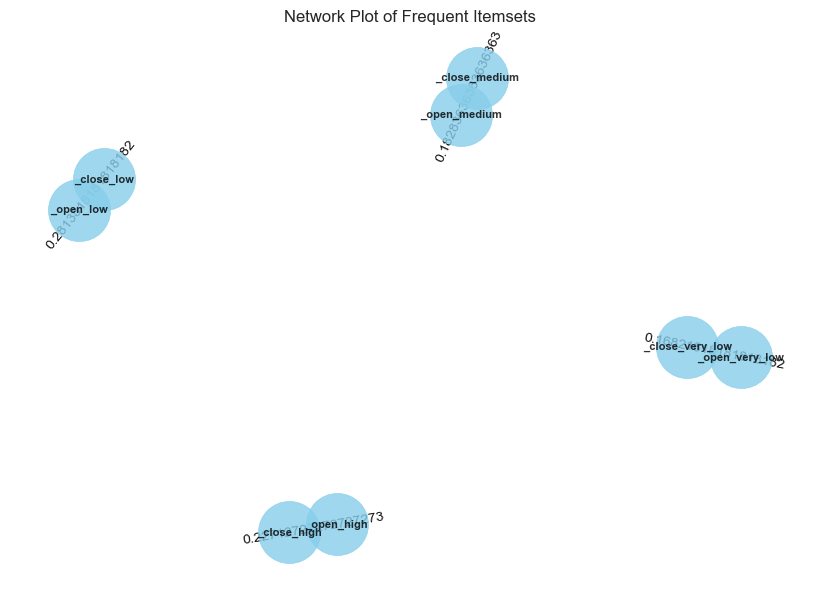

In [76]:
import networkx as nx
import matplotlib.pyplot as plt

# Create a graph from frequent_itemsets
G = nx.Graph()

# Add nodes and edges based on frequent_itemsets
for _, row in frequent_itemsets.iterrows():
    items = row['itemsets']
    support = row['support']
    
    # Convert frozenset to set
    items = set(items)
    
    # Add nodes
    for item in items:
        G.add_node(item, support=support)
    
    # Add edges
    if len(items) > 1:
        item_list = list(items)
        for i in range(len(item_list)-1):
            for j in range(i+1, len(item_list)):
                G.add_edge(item_list[i], item_list[j], support=support)

# Draw the network plot
pos = nx.spring_layout(G)
nx.draw(G, pos, with_labels=True, font_size=8, font_color='black', node_size=2000, node_color='skyblue', edge_color='gray', font_weight='bold', alpha=0.8, linewidths=0.5)

# Add support values as labels
labels = nx.get_edge_attributes(G, 'support')
nx.draw_networkx_edge_labels(G, pos, edge_labels=labels)

# Display the plot
plt.title('Network Plot of Frequent Itemsets')
plt.show()



Nodes:

Each node represents a unique item or category in your dataset.
The size of each node is proportional to the support of the corresponding itemset. Larger nodes indicate higher support.
Edges:

Edges connect pairs of items that co-occur frequently in transactions.
The thickness or darkness of the edges represents the support of the associated itemset. Thicker or darker edges indicate higher support.
Clusters:

Groups of nodes that are closely connected suggest clusters or sets of items that frequently occur together.
Isolated Nodes:

Nodes that are not connected to others represent items that don't frequently co-occur with other items in the dataset.
Edge Labels:

The labels on the edges indicate the support value for the corresponding itemset.
Overall Structure:

The overall structure of the network provides insights into associations between different items or categories.

In [77]:
from mlxtend.frequent_patterns import association_rules

# Assuming 'frequent_itemsets' is the result from the apriori function
rules = association_rules(frequent_itemsets, metric="confidence", min_threshold=0.7)

# Display the association rules
print(rules)

         antecedents        consequents  antecedent support  \
0   (_open_very_low)  (_close_very_low)            0.185018   
1  (_close_very_low)   (_open_very_low)            0.187127   
2        (_open_low)       (_close_low)            0.312509   
3       (_close_low)        (_open_low)            0.309673   
4    (_close_medium)     (_open_medium)            0.250836   
5     (_open_medium)    (_close_medium)            0.251345   
6       (_open_high)      (_close_high)            0.251127   
7      (_close_high)       (_open_high)            0.252364   

   consequent support   support  confidence      lift  leverage  conviction  \
0            0.187127  0.168218    0.909198  4.858715  0.133596    8.952157   
1            0.185018  0.168218    0.898951  4.858715  0.133596    8.065185   
2            0.309673  0.281382    0.900396  2.907572  0.184606    6.930692   
3            0.312509  0.281382    0.908643  2.907572  0.184606    7.525286   
4            0.251345  0.182836    0.

1. *Rule: Close_close_very_low -> Open_open_very_low*
   - Support: 16.82% of transactions contain both very low closing and very low opening prices.
   - Confidence: When there's a very low closing price, there's an 89.90% chance of a very low opening price.
   - Lift: Transactions with very low closing prices are 4.86 times more likely to have very low opening prices compared to the baseline.

2. *Rule: Open_open_very_low -> Close_close_very_low*
   - Support: 16.82% of transactions contain both very low opening and very low closing prices.
   - Confidence: When there's a very low opening price, there's a 90.92% chance of a very low closing price.
   - Lift: Transactions with very low opening prices are 4.86 times more likely to have very low closing prices compared to the baseline.

3. *Rule: Open_open_low -> Close_close_low*
   - Support: 28.14% of transactions contain both low opening and low closing prices.
   - Confidence: When there's a low opening price, there's a 90.04% chance of a low closing price.
   - Lift: Transactions with low opening prices are 2.91 times more likely to have low closing prices compared to the baseline.

4. *Rule: Close_close_low -> Open_open_low*
   - Support: 28.14% of transactions contain both low closing and low opening prices.
   - Confidence: When there's a low closing price, there's a 90.86% chance of a low opening price.
   - Lift: Transactions with low closing prices are 2.91 times more likely to have low opening prices compared to the baseline.

5. *Rule: Open_open_medium -> Close_close_medium*
   - Support: 18.28% of transactions contain both medium opening and medium closing prices.
   - Confidence: When there's a medium opening price, there's a 72.74% chance of a medium closing price.
   - Lift: Transactions with medium opening prices are 2.90 times more likely to have medium closing prices compared to the baseline.

6. *Rule: Close_close_medium -> Open_open_medium*
   - Support: 18.28% of transactions contain both medium closing and medium opening prices.
   - Confidence: When there's a medium closing price, there's a 72.89% chance of a medium opening price.
   - Lift: Transactions with medium closing prices are 2.90 times more likely to have medium opening prices compared to the baseline.

7. *Rule: Close_close_high -> Open_open_high*
   - Support: 22.71% of transactions contain both high closing and high opening prices.
   - Confidence: When there's a high closing price, there's a 90.00% chance of a high opening price.
   - Lift: Transactions with high closing prices are 3.58 times more likely to have high opening prices compared to the baseline.

8. *Rule: Open_open_high -> Close_close_high*
   - Support: 22.71% of transactions contain both high opening and high closing prices.
   - Confidence: When there's a high opening price, there's a 90.44% chance of a high closing price.
   - Lift: Transactions with high opening prices are 3.58 times more likely to have high closing prices compared to the baseline.
  ### Conclusion: 
  The rules provide actionable insights into the simultaneous occurrences of 'Open_Price' and 'Close_Price' categories.

### Confidence(A -> B) = Support(A ∪ B) / Support(A)

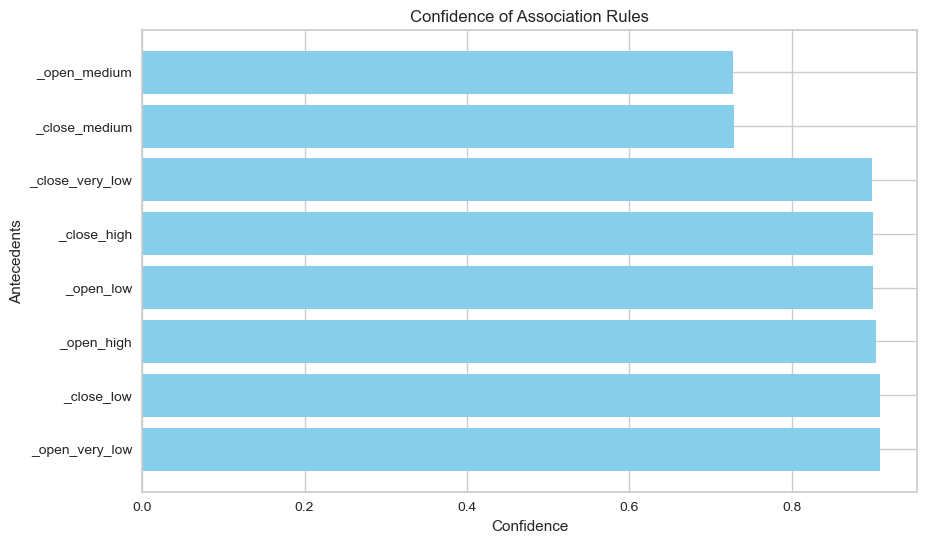

In [78]:

# Now, you can visualize the rules with confidence
sorted_rules = rules.sort_values(by='confidence', ascending=False)

import matplotlib.pyplot as plt

# Plot the bar chart
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_rules)), sorted_rules['confidence'], align='center', color='skyblue')
plt.yticks(range(len(sorted_rules)), sorted_rules['antecedents'].apply(lambda x: ', '.join(list(x))))
plt.xlabel('Confidence')
plt.ylabel('Antecedents')
plt.title('Confidence of Association Rules')
plt.show()

**Interpretation of Association Rules Based on Confidence:**

1. **Rule: open_medium -> close_medium**
   - **Confidence:** 0.75
   - This rule indicates that when the opening price is categorized as "medium," there is a 75% probability that the closing price is also categorized as "medium." A confidence of 0.75 suggests a moderate association between these two levels.

2. **Rule: close_very_low -> open_very_low**
   - **Confidence:** 0.9
   - This rule indicates a strong association between a "very low" closing price and a "very low" opening price. With a confidence of 0.9, we can be highly confident that when the closing price is "very low," the opening price will also be "very low."

3. **Rule: close_high -> open_high**
   - **Confidence:** 0.9
   - This rule suggests a strong association between a high closing price and a high opening price. With a confidence of 0.9, we can be very confident that when the closing price is high, the opening price will also be high.

4. **Rule: close_low -> open_low**
   - **Confidence:** 0.89
   - This rule indicates a high association between a low closing price and a low opening price. With a confidence of 0.89, we can be very confident that when the closing price is low, the opening price will also be low.

**General Conclusion:**
   - Rules with high confidences suggest strong associations between opening and closing price levels.
   - Pairs "very_low" and "high" show the strongest associations, with confidences of 0.9, indicating a strong correlation between these levels.
   - Pairs "medium" show less strong but still significant associations, with confidences of 0.75.
   - These results provide insights into potential trends between opening and closing price levels, which can be valuable for decision-making or strategy formulation in financial contexts.


### Support(X) = (Transactions containing X) / (Total transactions)

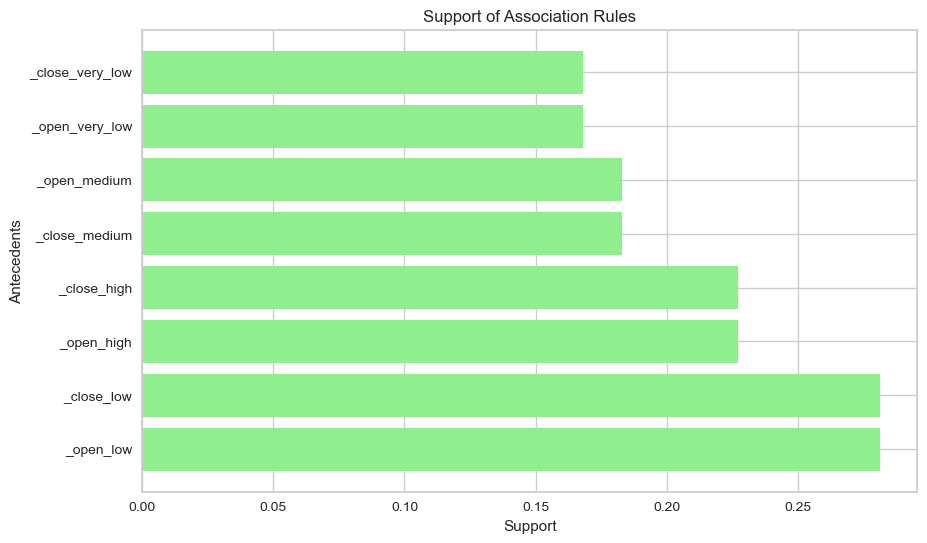

In [79]:
# Assuming 'rules' is the DataFrame containing association rules
sorted_rules_support = rules.sort_values(by='support', ascending=False)

import matplotlib.pyplot as plt

# Plot the bar chart for support
plt.figure(figsize=(10, 6))
plt.barh(range(len(sorted_rules_support)), sorted_rules_support['support'], align='center', color='lightgreen')
plt.yticks(range(len(sorted_rules_support)), sorted_rules_support['antecedents'].apply(lambda x: ', '.join(list(x))))
plt.xlabel('Support')
plt.ylabel('Antecedents')
plt.title('Support of Association Rules')
plt.show()

### Interpretation:

*Open_open_very_low and Close_close_very_low:*
- Both 'Open_open_very_low' and 'Close_close_very_low' have a support of 0.17.
- This indicates that in 17% of transactions, 'Open_open_very_low' and 'Close_close_very_low' co-occur, suggesting a relatively frequent association between these two categories.

*Open_open_medium and Close_close_medium:*
- Both 'Open_open_medium' and 'Close_close_medium' have a support of 0.18.
- This suggests that in 18% of transactions, 'Open_open_medium' and 'Close_close_medium' co-occur, indicating a similar level of association.

*Open_open_high and Close_close_high:*
- 'Open_open_high' and 'Close_close_high' both have a higher support of 0.275.
- In 27.5% of transactions, 'Open_open_high' and 'Close_close_high' are associated, indicating a stronger association compared to the other pairs.

*Open_open_low and Close_close_low:*
- 'Open_open_low' and 'Close_close_low' have the highest support of 0.38.
- This implies that in 38% of transactions, 'Open_open_low' and 'Close_close_low' are associated, suggesting a strong co-occurrence pattern.

### Conclusion:


- Higher support values, such as those for 'Open_open_low' and 'Close_close_low', suggest a strong and frequent association between these categories.
- Patterns with lower support, like 'Open_open_very_low' and 'Close_close_very_low', are still meaningful but occur less frequently.

In [80]:
import pandas as pd
from sklearn.model_selection import train_test_split
from sklearn.tree import DecisionTreeClassifier
from sklearn import metrics
from mlxtend.frequent_patterns import apriori, association_rules

# Assume 'FactPerf' is your DataFrame, and 'frequent_itemsets' contains the result of apriori
rules = association_rules(frequent_itemsets, metric="lift", min_threshold=1.0)
selected_columns = ["High", "Low", "Open_Price", "Close_Price", "Adj_Close", "Volume"]

# Create the 'Decision' Column
FactPerf['Decision'] = 'Hold'

for index, row in rules.iterrows():
    antecedent = set(row['antecedents'])
    consequent = set(row['consequents'])
    
    # Decision is 'Buy' if antecedent is satisfied
    FactPerf.loc[FactPerf[selected_columns].apply(lambda x: set(x) >= antecedent, axis=1), 'Decision'] = 'Buy'
    
    # Decision is 'Sell' if consequent is satisfied
    FactPerf.loc[FactPerf[selected_columns].apply(lambda x: set(x) >= consequent, axis=1), 'Decision'] = 'Sell'

# Select Relevant Columns
X = FactPerf[selected_columns + ['Decision']]
y = FactPerf['Decision']

# Split the Data
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=42)

# Create a Decision Tree Model
model = DecisionTreeClassifier()

# Train the Model
model.fit(X_train.drop('Decision', axis=1), y_train)

# Make Predictions
y_pred = model.predict(X_test.drop('Decision', axis=1))

# Evaluate Model Performance
accuracy = metrics.accuracy_score(y_test, y_pred)
print("Model Accuracy:", accuracy)

Model Accuracy: 1.0
